In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from geopy.distance import geodesic

# === PARAMETERS ===
FICHIER_CSV = "all_data_enriched.csv"
MA_WINDOW = 10  # moving average window size

# === LOAD DATA ===
df = pd.read_csv(FICHIER_CSV, low_memory=False)

# === Evaluation Functions ===
def compute_path_distance(latitudes, longitudes):
    points = list(zip(latitudes, longitudes))
    return sum(geodesic(points[i], points[i+1]).meters for i in range(len(points)-1))

def compute_straight_line_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).meters

def compute_integral(time, speed):
    return np.trapz(speed, time)

def evaluate_maneuver(maneuver_data):
    times = maneuver_data['SecondsSince1970'].values
    sog = maneuver_data['SOG'].values
    vmg = maneuver_data['VMG'].values

    # Eval 1
    path_distance = compute_path_distance(maneuver_data['Lat'].values, maneuver_data['Lon'].values)
    A_lat, A_lon = maneuver_data['Lat'].iloc[0], maneuver_data['Lon'].iloc[0]
    B_lat, B_lon = maneuver_data['Lat'].iloc[-1], maneuver_data['Lon'].iloc[-1]
    ab_distance = compute_straight_line_distance(A_lat, A_lon, B_lat, B_lon)
    ratio_path_ab = path_distance / ab_distance if ab_distance != 0 else np.nan

    # Eval 2
    dt = times[-1] - times[0]
    v_avg_entry = np.mean(sog[:10])
    dx_sog = v_avg_entry * dt
    integral_sog = compute_integral(times, sog)
    distance_lost_sog = dx_sog - integral_sog

    # Eval 3
    v_avg_entry_vmg = np.mean(vmg[:10])
    dx_vmg = v_avg_entry_vmg * dt
    integral_vmg = compute_integral(times, vmg)
    distance_lost_vmg = dx_vmg - integral_vmg

    return {
        "Ratio Path/AB": ratio_path_ab,
        "Distance Lost (SOG)": distance_lost_sog,
        "Distance Lost (VMG)": distance_lost_vmg
    }

# === Plotting Function with Filtering and Eval Display ===
def plot(df, rider_name, maneuver_type_filter=None):
    rider_data = df[df['rider_name'] == rider_name]
    if rider_data.empty:
        print(f"No data found for rider: {rider_name}")
        return

    for run_name in rider_data['run'].unique():
        run_data = rider_data[rider_data['run'] == run_name]

        for maneuver_index in run_data['maneuver_index'].unique():
            maneuver_data = run_data[run_data['maneuver_index'] == maneuver_index]
            maneuver_type = maneuver_data['maneuver_type'].iloc[0]

            if maneuver_type_filter and maneuver_type != maneuver_type_filter:
                continue

            # Evaluation
            eval_results = evaluate_maneuver(maneuver_data)

            # Summary
            print(f"\n=== {rider_name} - Run: {run_name} - Maneuver {maneuver_index} ({maneuver_type}) ===")
            print(f"Start: {maneuver_data['start_time'].iloc[0]} | End: {maneuver_data['end_time'].iloc[0]}")
            print(f"Duration: {maneuver_data['interval_duration'].iloc[0]} sec")
            print(f"TWS mean: {maneuver_data['TWS'].mean():.2f} kn | TWA mean: {maneuver_data['TWA'].mean():.2f}°")
            print(f"[Eval 1] Path / AB Ratio       : {eval_results['Ratio Path/AB']:.3f}")
            print(f"[Eval 2] Distance Lost (SOG)   : {eval_results['Distance Lost (SOG)']:.2f} m")
            print(f"[Eval 3] Distance Lost (VMG)   : {eval_results['Distance Lost (VMG)']:.2f} m")

            # === Optional: Add plotting here if desired ===
            # plt.figure() ...
            # plt.show()

# === Example Call ===
plot(df, rider_name="Alice", maneuver_type_filter="Tack")  # Change values as needed


            fig, axes = plt.subplots(3, 5, figsize=(20, 12))
            fig.suptitle(f'{rider_name} - Run: {run_name} - Maneuver ID: {maneuver_index} - Maneuver type: {maneuver_type}', fontsize=16)

            # Lat/Lon (no moving average)
            axes[0, 0].plot(maneuver_data['Lon'], maneuver_data['Lat'], color='blue')
            axes[0, 0].set_title("Lat (y) / Lon (x)")
            axes[0, 0].set_xlabel("Longitude")
            axes[0, 0].set_ylabel("Latitude")

            # SOG
            axes[0, 1].plot(maneuver_data['SecondsSince1970'], maneuver_data['SOG'], color='green', alpha=0.5)
            axes[0, 1].plot(maneuver_data['SecondsSince1970'], maneuver_data['SOG'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
            axes[0, 1].set_title("Speed Over Ground (SOG)")
            axes[0, 1].set_xlabel("Time")
            axes[0, 1].set_ylabel("SOG (knots)")
            axes[0, 1].tick_params(axis='x', rotation=45)

            # COG
            axes[0, 2].plot(maneuver_data['SecondsSince1970'], maneuver_data['COG'], color='orange', alpha=0.5)
            axes[0, 2].plot(maneuver_data['SecondsSince1970'], maneuver_data['COG'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
            axes[0, 2].set_title("Course Over Ground (COG)")
            axes[0, 2].set_xlabel("Time")
            axes[0, 2].set_ylabel("COG (degrees)")
            axes[0, 2].tick_params(axis='x', rotation=45)

            # Heel_Abs
            axes[0, 3].plot(maneuver_data['SecondsSince1970'], maneuver_data['Heel_Abs'], color='red', alpha=0.5)
            axes[0, 3].plot(maneuver_data['SecondsSince1970'], maneuver_data['Heel_Abs'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
            axes[0, 3].set_title("Heel_Abs Angle")
            axes[0, 3].set_xlabel("Time")
            axes[0, 3].set_ylabel("Heel_Abs (degrees)")
            axes[0, 3].tick_params(axis='x', rotation=45)

            # Trim
            axes[0, 4].plot(maneuver_data['SecondsSince1970'], maneuver_data['Trim'], color='red', alpha=0.5)
            axes[0, 4].plot(maneuver_data['SecondsSince1970'], maneuver_data['Trim'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
            axes[0, 4].set_title("Trim Angle")
            axes[0, 4].set_xlabel("Time")
            axes[0, 4].set_ylabel("Trim (degrees)")
            axes[0, 4].tick_params(axis='x', rotation=45)

            # Side_line2
            axes[1, 0].plot(maneuver_data['SecondsSince1970'], maneuver_data['side_line2'], color='cyan', alpha=0.5)
            axes[1, 0].plot(maneuver_data['SecondsSince1970'], maneuver_data['side_line2'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
            axes[1, 0].set_title("Side_lines2")
            axes[1, 0].set_xlabel("Time")
            axes[1, 0].set_ylabel("Side_lines2 (units)")
            axes[1, 0].tick_params(axis='x', rotation=45)

            # Line_C2
            axes[1, 1].plot(maneuver_data['SecondsSince1970'], maneuver_data['Line_C2'], color='blue', alpha=0.5)
            axes[1, 1].plot(maneuver_data['SecondsSince1970'], maneuver_data['Line_C2'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
            axes[1, 1].set_title("Central Line")
            axes[1, 1].set_xlabel("Time")
            axes[1, 1].set_ylabel("Force (N)")
            axes[1, 1].tick_params(axis='x', rotation=45)

            # VMG
            axes[1, 2].plot(maneuver_data['SecondsSince1970'], maneuver_data['VMG'], color='gray', alpha=0.5)
            axes[1, 2].plot(maneuver_data['SecondsSince1970'], maneuver_data['VMG'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
            axes[1, 2].set_title("VMG")
            axes[1, 2].set_xlabel("Time")
            axes[1, 2].set_ylabel("VMG (m/s)")
            axes[1, 2].tick_params(axis='x', rotation=45)

            if (maneuver_data['boat_name'] == "SenseBoard").all():
                # F_back
                axes[1, 3].plot(maneuver_data['SecondsSince1970'], maneuver_data['F_back'], color='blue', alpha=0.5)
                axes[1, 3].plot(maneuver_data['SecondsSince1970'], maneuver_data['F_back'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
                axes[1, 3].set_title("Back Force (F_back)")
                axes[1, 3].set_xlabel("Time")
                axes[1, 3].set_ylabel("Force (N)")
                axes[1, 3].tick_params(axis='x', rotation=45)

                # F_front
                axes[1, 4].plot(maneuver_data['SecondsSince1970'], maneuver_data['F_front'], color='green', alpha=0.5)
                axes[1, 4].plot(maneuver_data['SecondsSince1970'], maneuver_data['F_front'].rolling(MA_WINDOW, min_periods=1, center=True).mean(), color='black')
                axes[1, 4].set_title("Front Force (F_front)")
                axes[1, 4].set_xlabel("Time")
                axes[1, 4].set_ylabel("Force (N)")
                axes[1, 4].tick_params(axis='x', rotation=45)

            # Hide empty subplots
            axes[2, 0].axis('off')
            axes[2, 1].axis('off')
            axes[2, 2].axis('off')
            axes[2, 3].axis('off')
            axes[2, 4].axis('off')

            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()


### Maneuvers of Karl: 

Summary for Karl - Run: 08_06_Run1

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 07:47:39.859000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749368859.859
  End Time: 1749368873.859
  boat_name: Karl Maeder

avg TWS: 8.20 knots
avg TWA: 3.31 degrees
avg TWD: 309.75 degrees


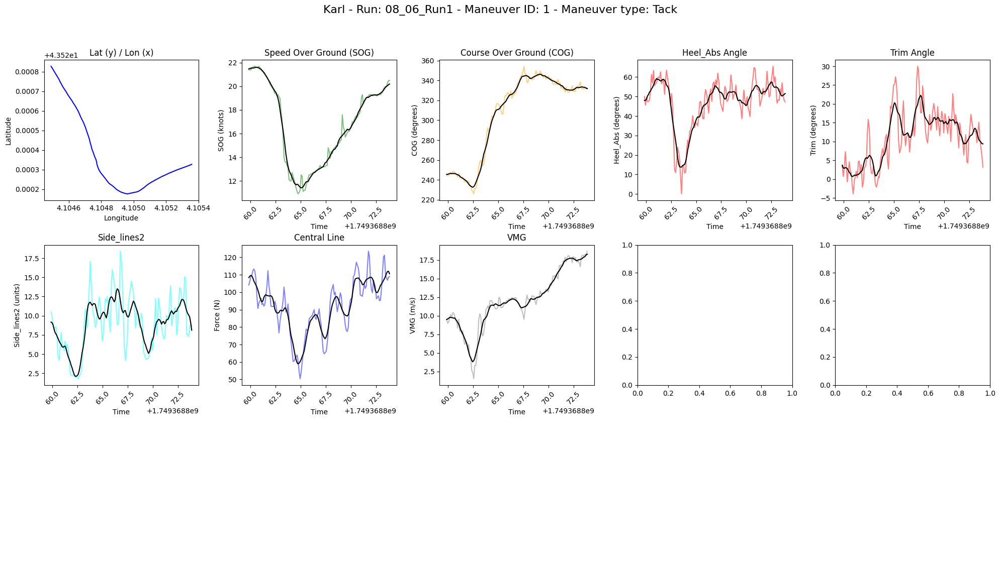


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 07:47:57.759000+00:00
  Maneuver Type: Tack
  Duration: 14.10099983215332 seconds
  Start Time: 1749368877.759
  End Time: 1749368891.86
  boat_name: Karl Maeder

avg TWS: 8.83 knots
avg TWA: 31.69 degrees
avg TWD: 302.04 degrees


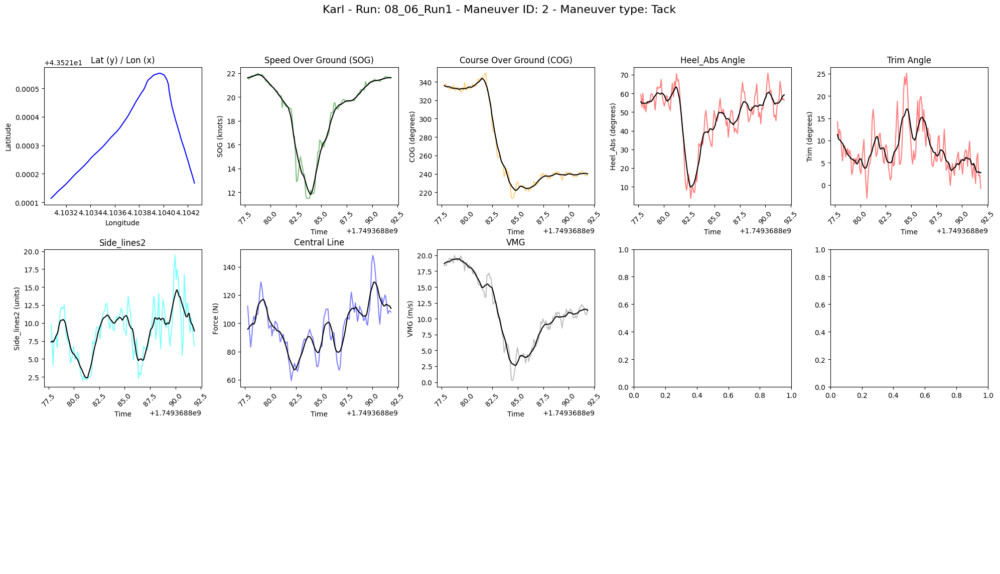


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 07:48:10.957000+00:00
  Maneuver Type: Tack
  Duration: 14.115999937057495 seconds
  Start Time: 1749368890.957
  End Time: 1749368905.073
  boat_name: Karl Maeder

avg TWS: 9.57 knots
avg TWA: -8.84 degrees
avg TWD: 296.73 degrees


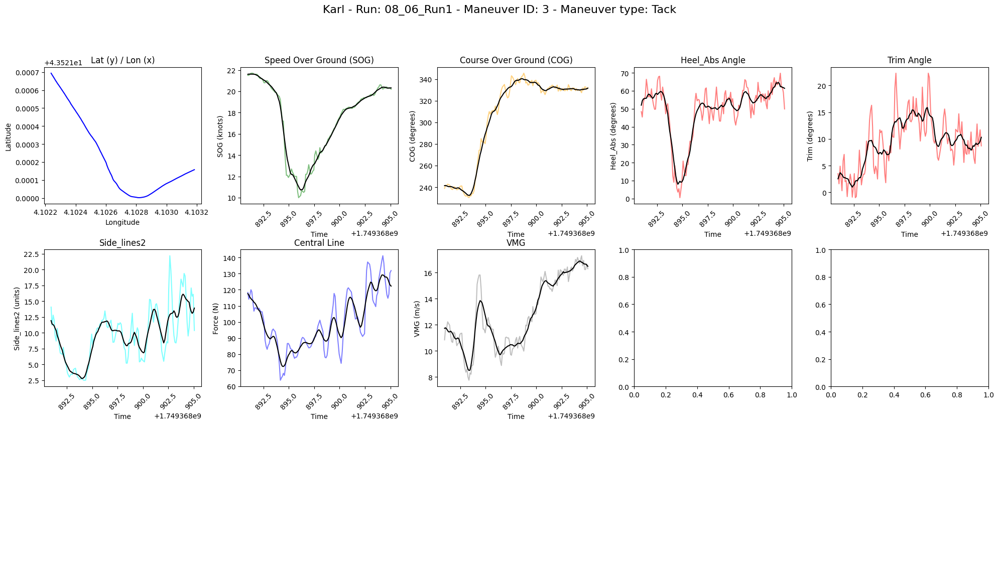


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 07:48:30.073000+00:00
  Maneuver Type: Tack
  Duration: 13.88700008392334 seconds
  Start Time: 1749368910.073
  End Time: 1749368923.96
  boat_name: Karl Maeder

avg TWS: 8.71 knots
avg TWA: 19.89 degrees
avg TWD: 290.02 degrees


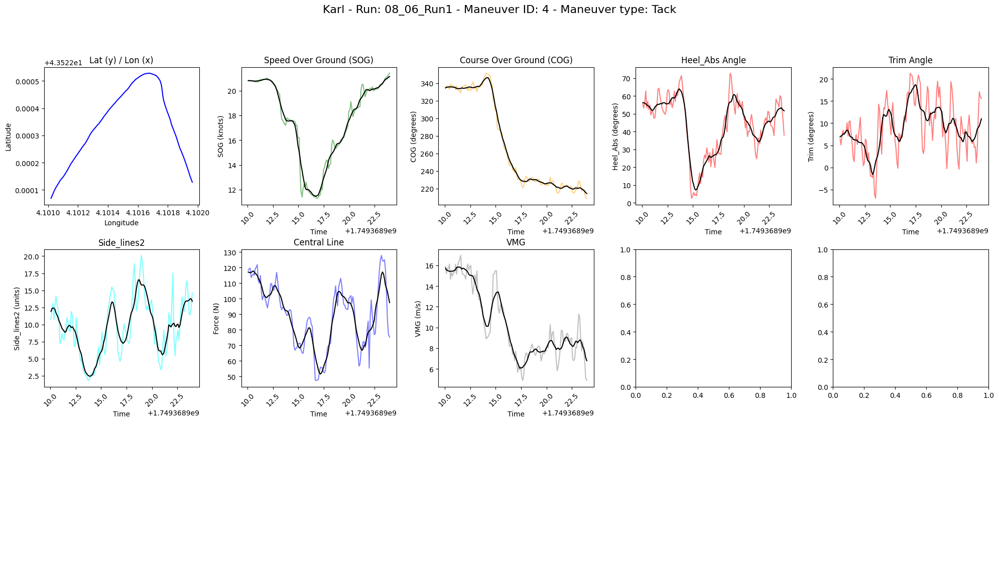


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-08 07:48:52.359000+00:00
  Maneuver Type: Jibe
  Duration: 14.098000049591064 seconds
  Start Time: 1749368932.359
  End Time: 1749368946.457
  boat_name: Karl Maeder

avg TWS: 8.61 knots
avg TWA: -42.58 degrees
avg TWD: 289.87 degrees


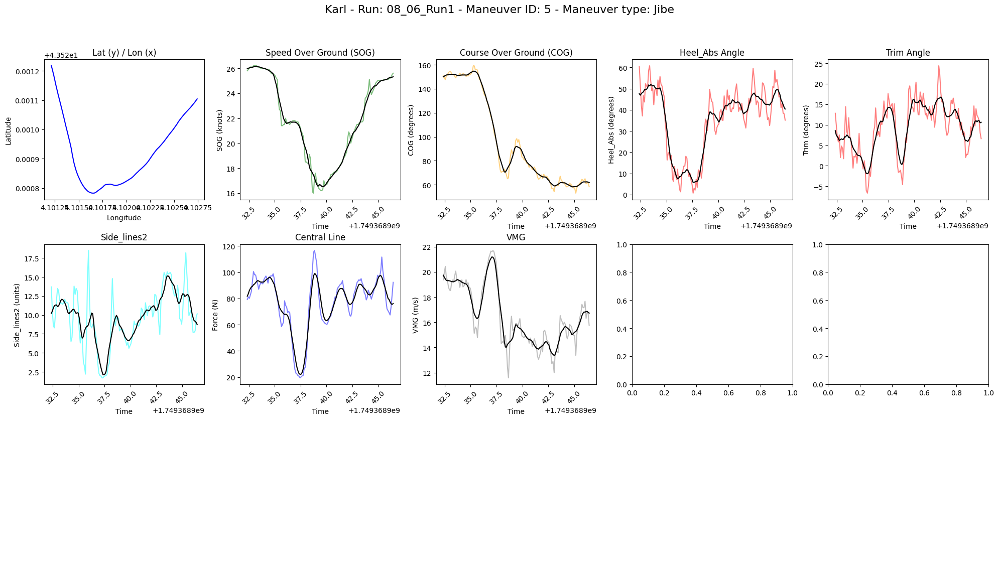


Maneuver details for Maneuver Index: 6
  Maneuver Time: 2025-06-08 07:49:07.062000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749368947.062
  End Time: 1749368961.062
  boat_name: Karl Maeder

avg TWS: 9.58 knots
avg TWA: 28.96 degrees
avg TWD: 292.13 degrees


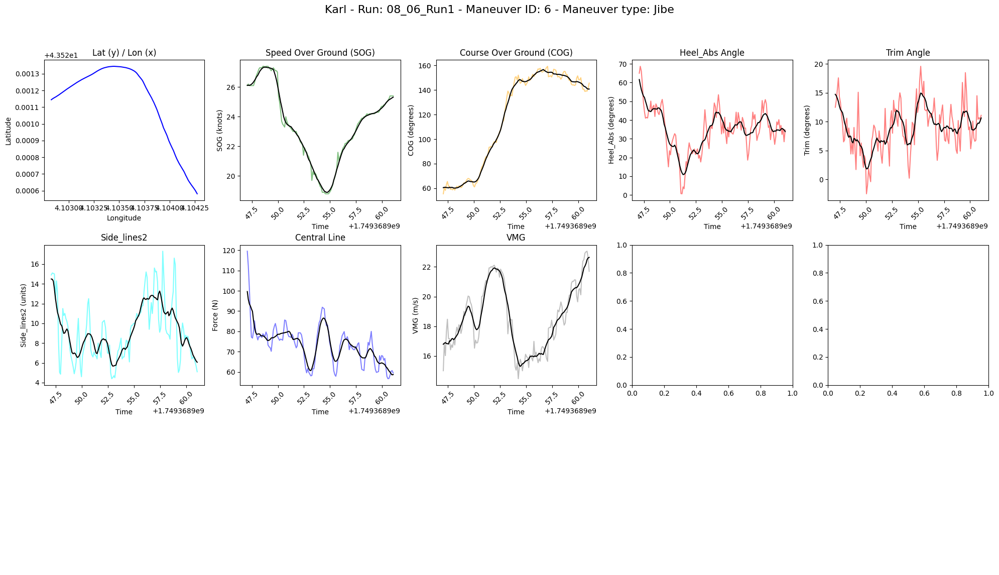


Maneuver details for Maneuver Index: 7
  Maneuver Time: 2025-06-08 07:49:19.260000+00:00
  Maneuver Type: Jibe
  Duration: 14.002000093460085 seconds
  Start Time: 1749368959.26
  End Time: 1749368973.262
  boat_name: Karl Maeder

avg TWS: 10.15 knots
avg TWA: -45.36 degrees
avg TWD: 294.52 degrees


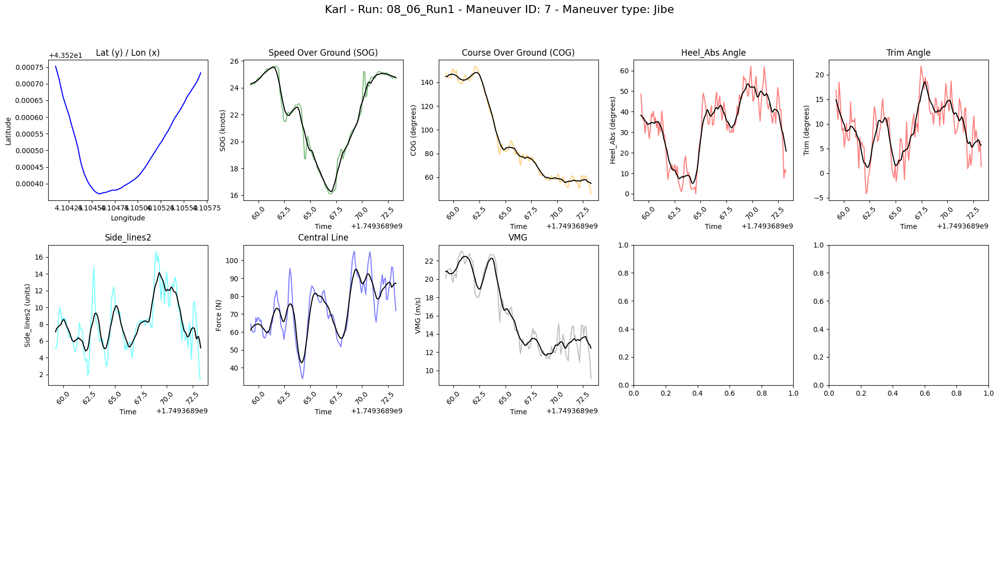


Maneuver details for Maneuver Index: 8
  Maneuver Time: 2025-06-08 07:49:33.759000+00:00
  Maneuver Type: buoy
  Duration: 14.000999927520752 seconds
  Start Time: 1749368973.759
  End Time: 1749368987.76
  boat_name: Karl Maeder

avg TWS: 9.08 knots
avg TWA: 73.53 degrees
avg TWD: 294.67 degrees


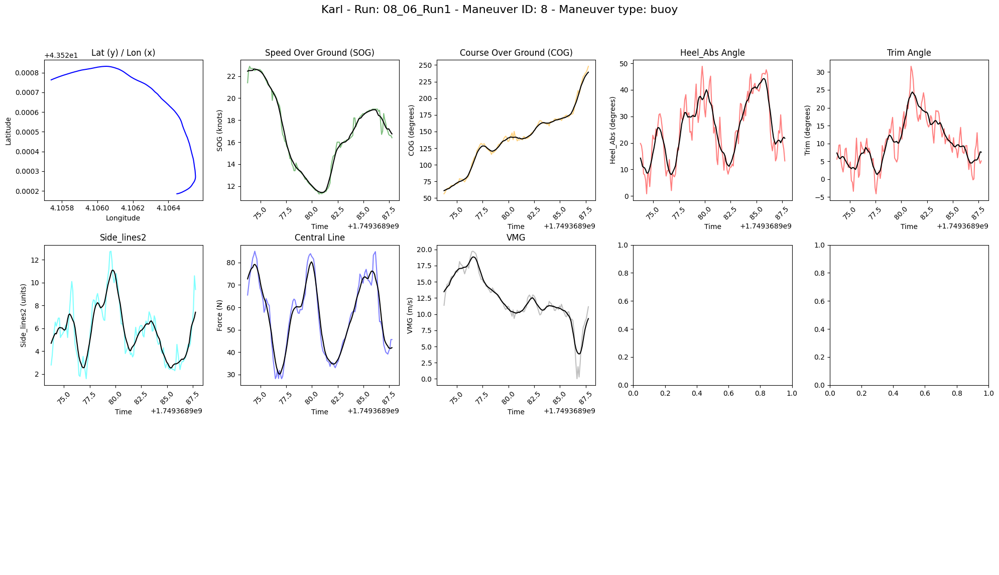


Maneuver details for Maneuver Index: 9
  Maneuver Time: 2025-06-08 07:50:22.262000+00:00
  Maneuver Type: Tack
  Duration: 13.997999906539915 seconds
  Start Time: 1749369022.262
  End Time: 1749369036.26
  boat_name: Karl Maeder

avg TWS: 8.61 knots
avg TWA: -1.05 degrees
avg TWD: 299.63 degrees


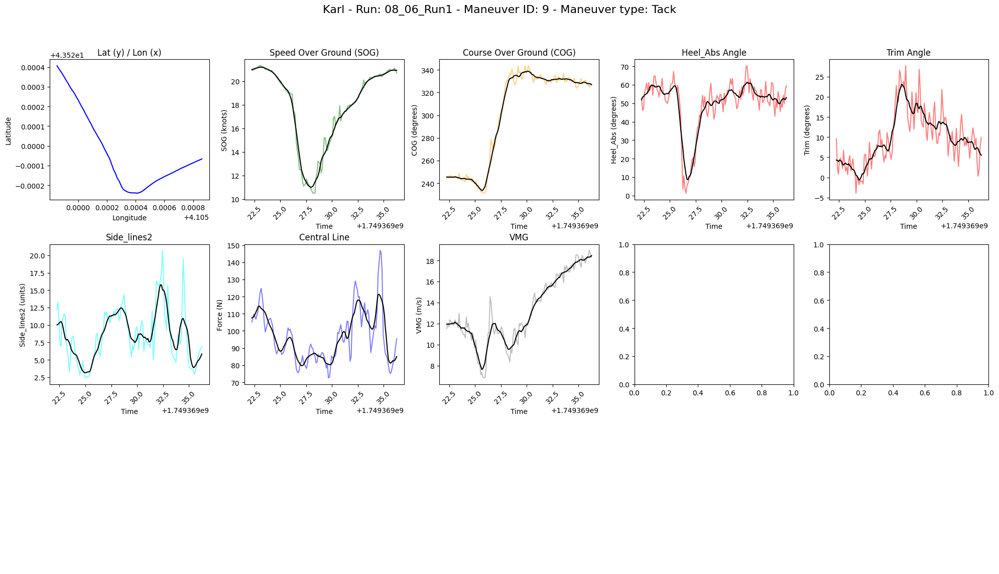


Maneuver details for Maneuver Index: 10
  Maneuver Time: 2025-06-08 07:50:39.160000+00:00
  Maneuver Type: Tack
  Duration: 14.003000020980837 seconds
  Start Time: 1749369039.16
  End Time: 1749369053.163
  boat_name: Karl Maeder

avg TWS: 8.97 knots
avg TWA: 21.16 degrees
avg TWD: 297.75 degrees


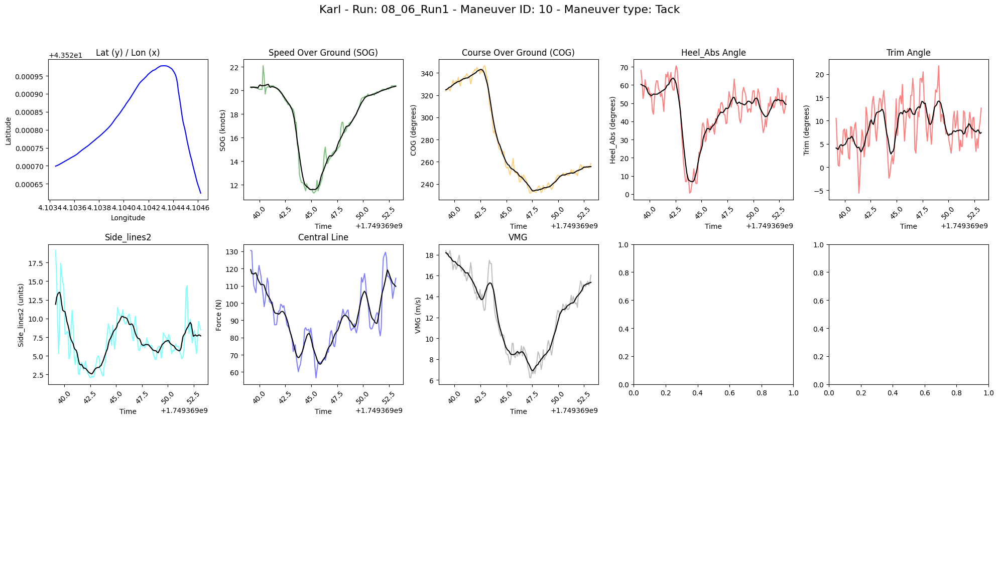


Maneuver details for Maneuver Index: 11
  Maneuver Time: 2025-06-08 07:50:54.558000+00:00
  Maneuver Type: Tack
  Duration: 14.003000020980837 seconds
  Start Time: 1749369054.558
  End Time: 1749369068.561
  boat_name: Karl Maeder

avg TWS: 9.79 knots
avg TWA: -20.28 degrees
avg TWD: 296.20 degrees


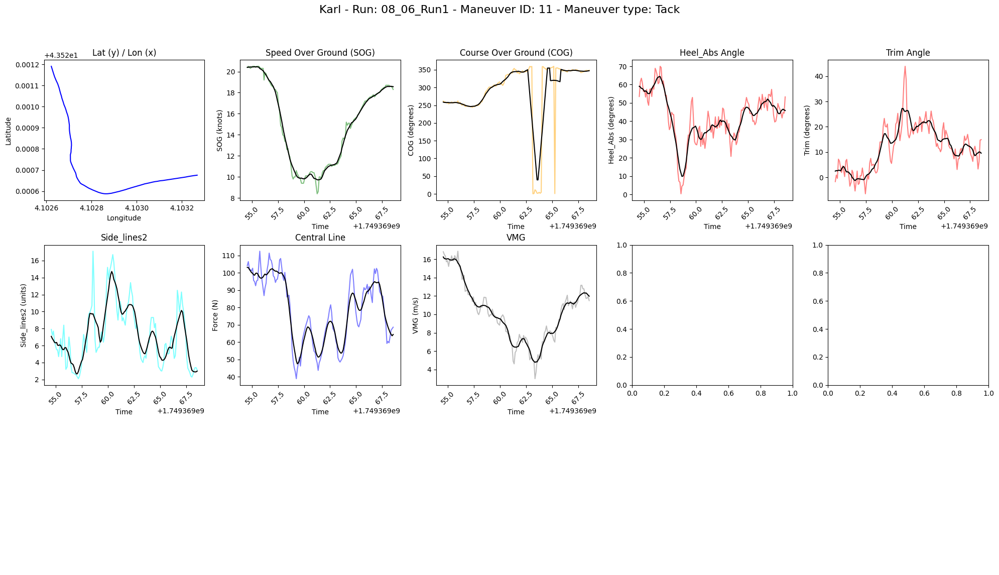


Maneuver details for Maneuver Index: 12
  Maneuver Time: 2025-06-08 07:51:19.466000+00:00
  Maneuver Type: Tack
  Duration: 13.993000030517578 seconds
  Start Time: 1749369079.466
  End Time: 1749369093.459
  boat_name: Karl Maeder

avg TWS: 10.48 knots
avg TWA: 30.51 degrees
avg TWD: 301.39 degrees


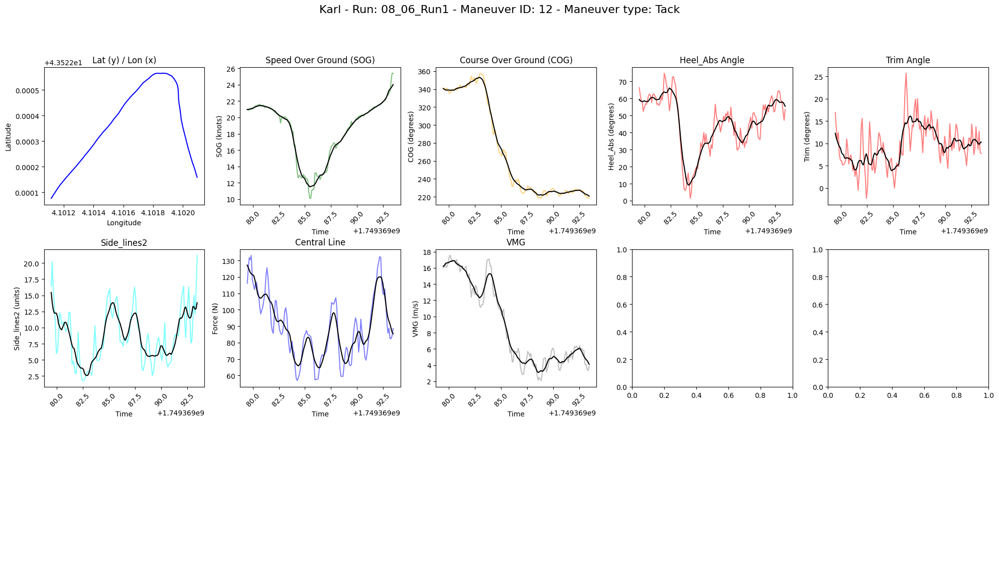


Maneuver details for Maneuver Index: 13
  Maneuver Time: 2025-06-08 07:51:44.559000+00:00
  Maneuver Type: Jibe
  Duration: 14.002000093460085 seconds
  Start Time: 1749369104.559
  End Time: 1749369118.561
  boat_name: Karl Maeder

avg TWS: 10.23 knots
avg TWA: -34.04 degrees
avg TWD: 299.93 degrees


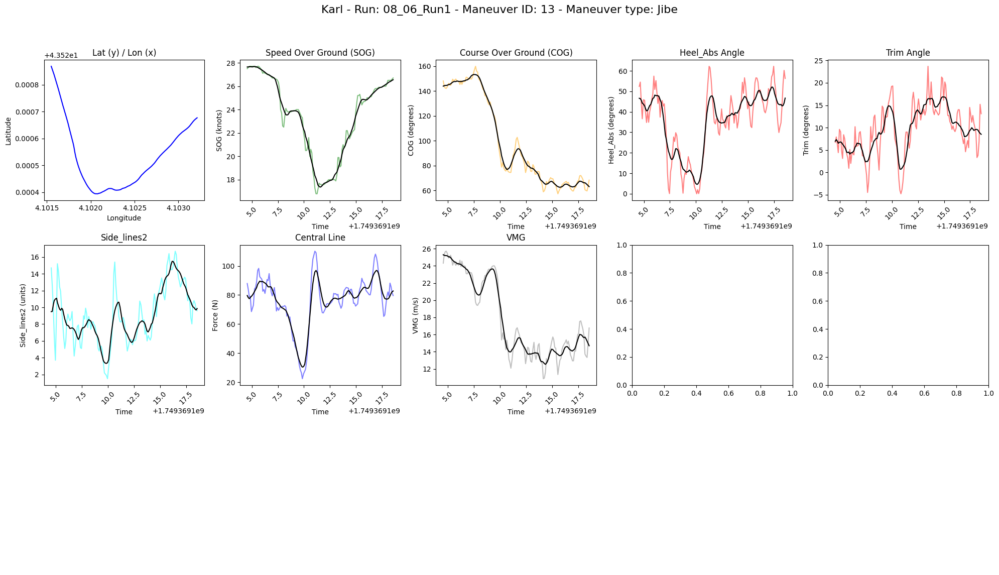


Maneuver details for Maneuver Index: 14
  Maneuver Time: 2025-06-08 07:51:59.360000+00:00
  Maneuver Type: Jibe
  Duration: 14.100000143051147 seconds
  Start Time: 1749369119.36
  End Time: 1749369133.46
  boat_name: Karl Maeder

avg TWS: 10.39 knots
avg TWA: 58.64 degrees
avg TWD: 299.36 degrees


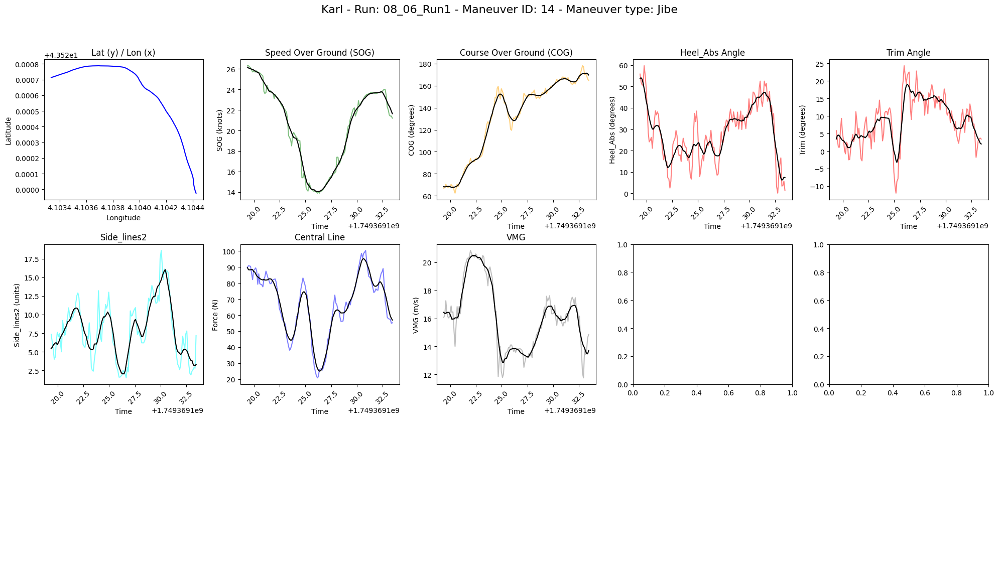

Summary for Karl - Run: 08_06_Run2

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:01:30.561000+00:00
  Maneuver Type: Tack
  Duration: 14.096999883651732 seconds
  Start Time: 1749369690.561
  End Time: 1749369704.658
  boat_name: Karl Maeder

avg TWS: 9.55 knots
avg TWA: -10.15 degrees
avg TWD: 289.24 degrees


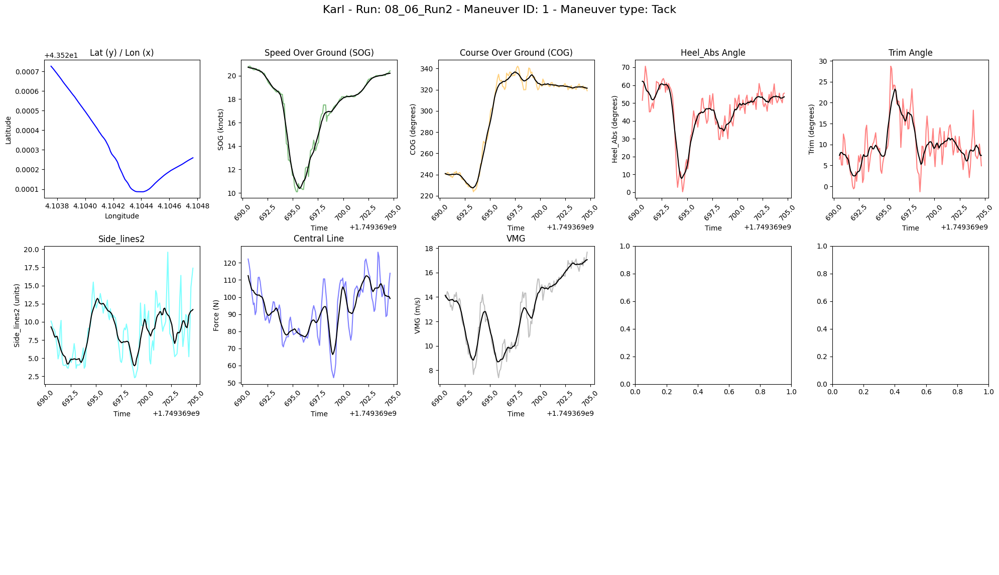


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:01:49.658000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749369709.658
  End Time: 1749369723.658
  boat_name: Karl Maeder

avg TWS: 9.71 knots
avg TWA: 19.38 degrees
avg TWD: 290.89 degrees


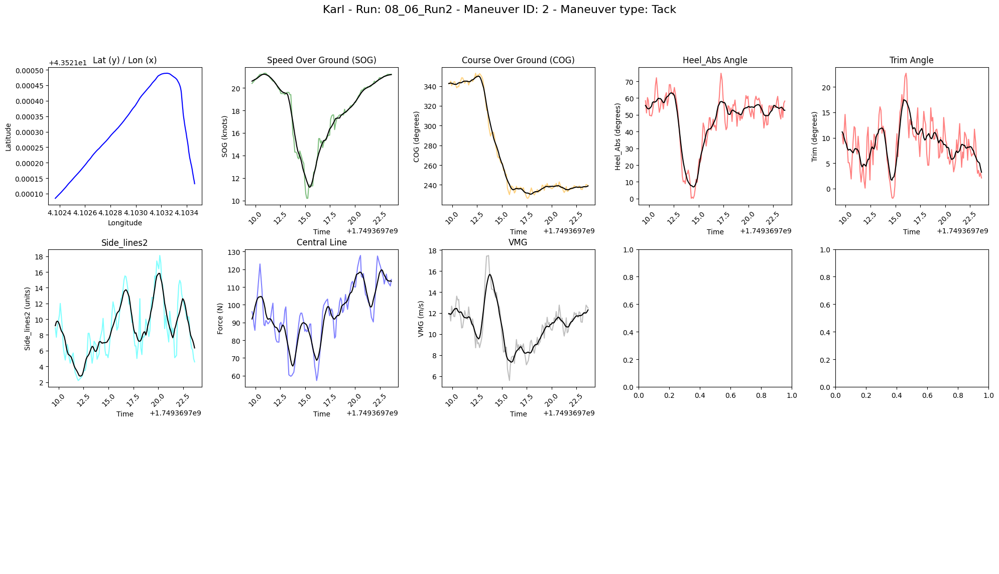


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:02:01.960000+00:00
  Maneuver Type: Tack
  Duration: 13.98799991607666 seconds
  Start Time: 1749369721.96
  End Time: 1749369735.948
  boat_name: Karl Maeder

avg TWS: 10.21 knots
avg TWA: -14.82 degrees
avg TWD: 290.63 degrees


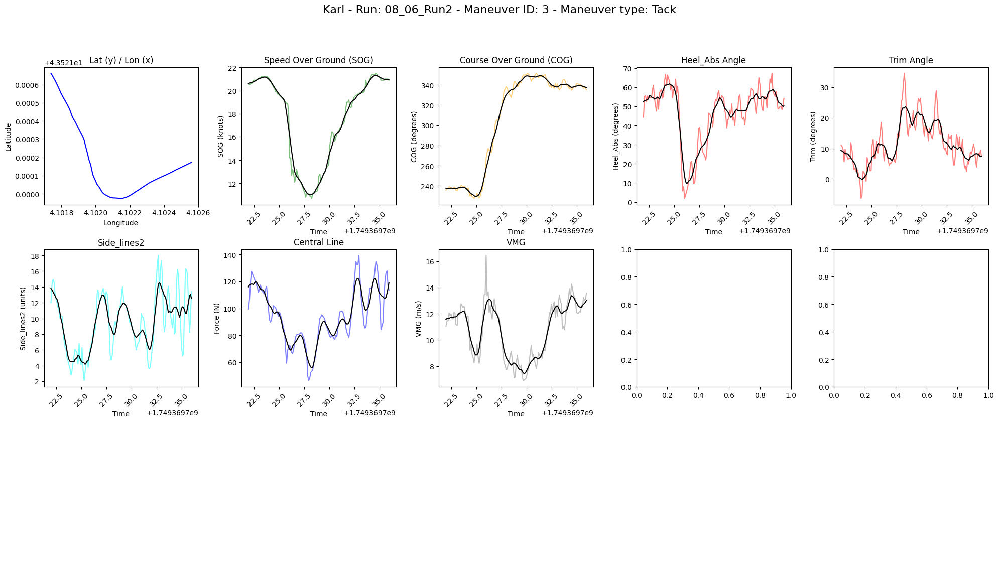


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 08:02:18.160000+00:00
  Maneuver Type: buoy
  Duration: 13.898000001907349 seconds
  Start Time: 1749369738.16
  End Time: 1749369752.058
  boat_name: Karl Maeder

avg TWS: 7.95 knots
avg TWA: 29.09 degrees
avg TWD: 285.18 degrees


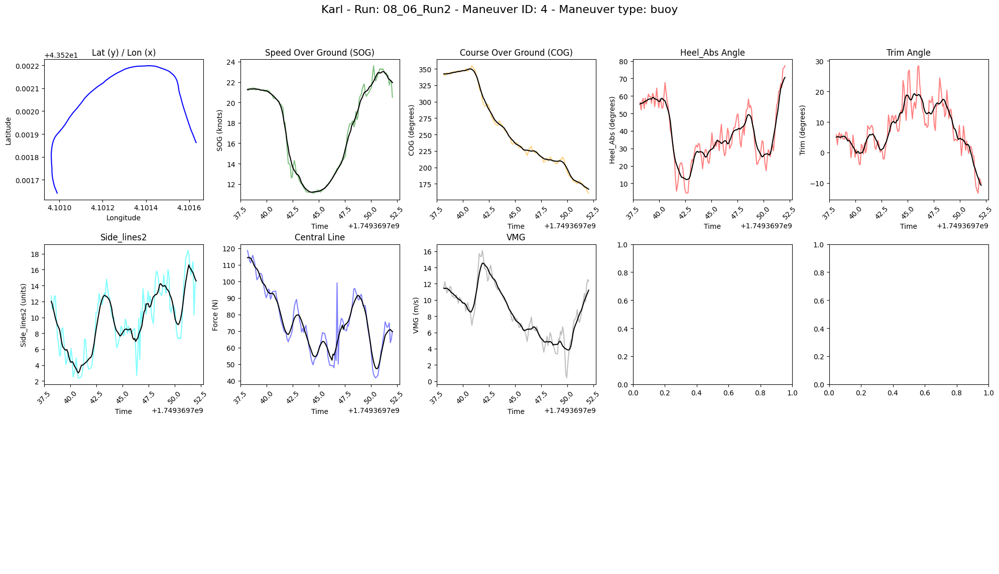


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-08 08:02:44.959000+00:00
  Maneuver Type: Jibe
  Duration: 14.000999927520752 seconds
  Start Time: 1749369764.959
  End Time: 1749369778.96
  boat_name: Karl Maeder

avg TWS: 8.19 knots
avg TWA: -37.73 degrees
avg TWD: 291.09 degrees


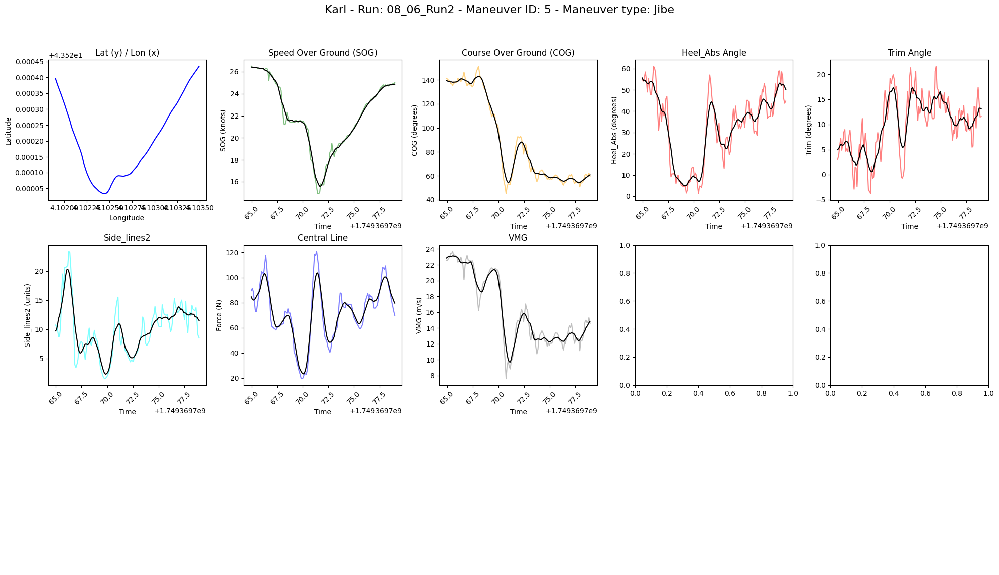


Maneuver details for Maneuver Index: 6
  Maneuver Time: 2025-06-08 08:03:37.359000+00:00
  Maneuver Type: Tack
  Duration: 14.000999927520752 seconds
  Start Time: 1749369817.359
  End Time: 1749369831.36
  boat_name: Karl Maeder

avg TWS: 8.17 knots
avg TWA: -16.09 degrees
avg TWD: 282.49 degrees


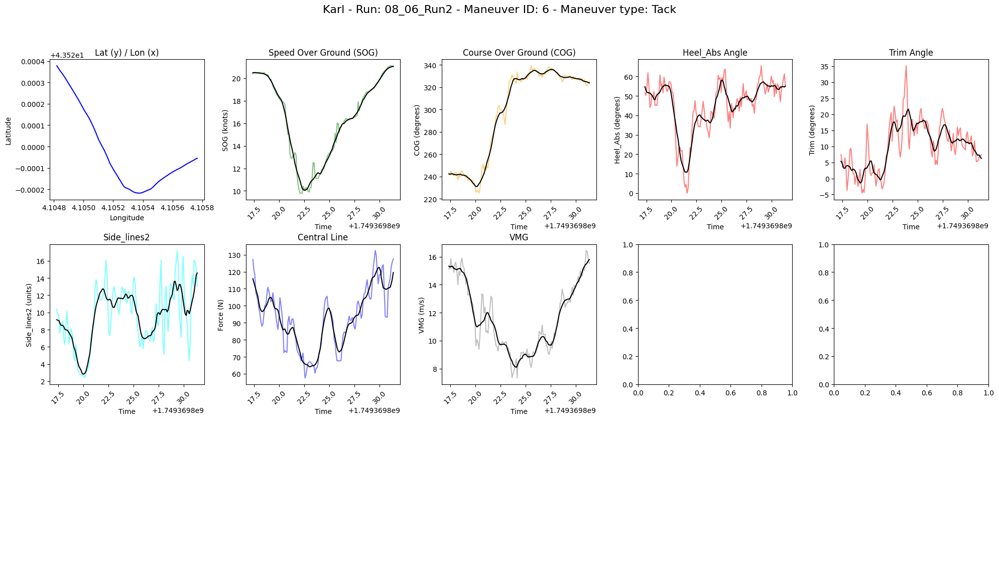


Maneuver details for Maneuver Index: 7
  Maneuver Time: 2025-06-08 08:03:52.262000+00:00
  Maneuver Type: Tack
  Duration: 14.097999811172484 seconds
  Start Time: 1749369832.262
  End Time: 1749369846.36
  boat_name: Karl Maeder

avg TWS: 7.84 knots
avg TWA: 10.90 degrees
avg TWD: 284.41 degrees


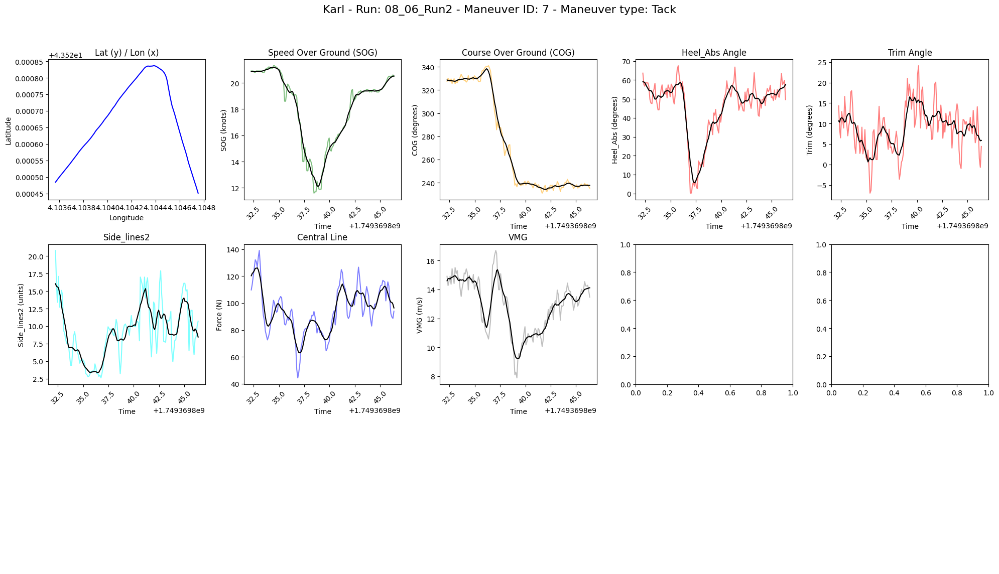


Maneuver details for Maneuver Index: 8
  Maneuver Time: 2025-06-08 08:04:08.265000+00:00
  Maneuver Type: Tack
  Duration: 14.09499979019165 seconds
  Start Time: 1749369848.265
  End Time: 1749369862.36
  boat_name: Karl Maeder

avg TWS: 6.25 knots
avg TWA: -23.53 degrees
avg TWD: 283.98 degrees


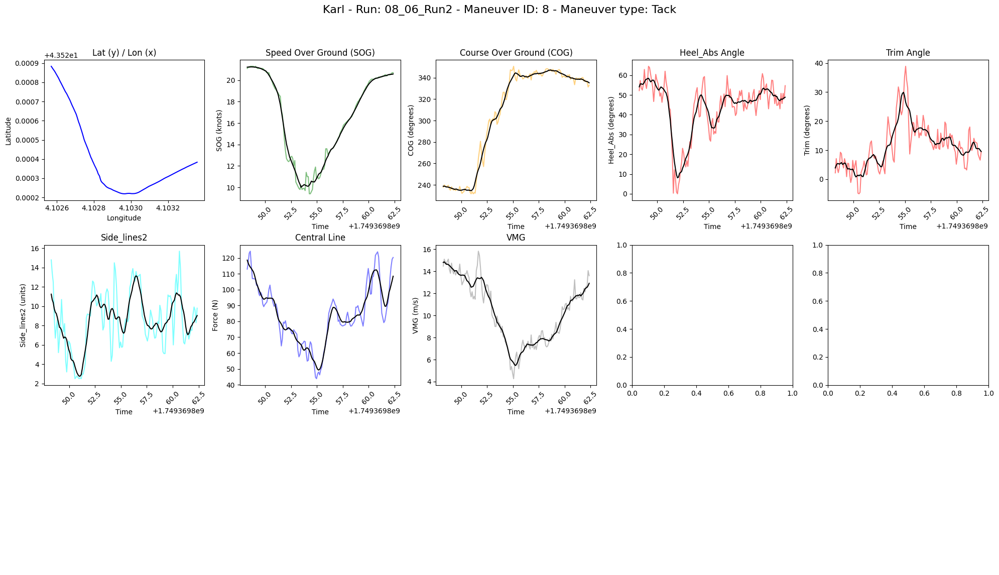


Maneuver details for Maneuver Index: 9
  Maneuver Time: 2025-06-08 08:04:34.560000+00:00
  Maneuver Type: buoy
  Duration: 14.098000049591064 seconds
  Start Time: 1749369874.56
  End Time: 1749369888.658
  boat_name: Karl Maeder

avg TWS: 8.82 knots
avg TWA: 22.98 degrees
avg TWD: 284.78 degrees


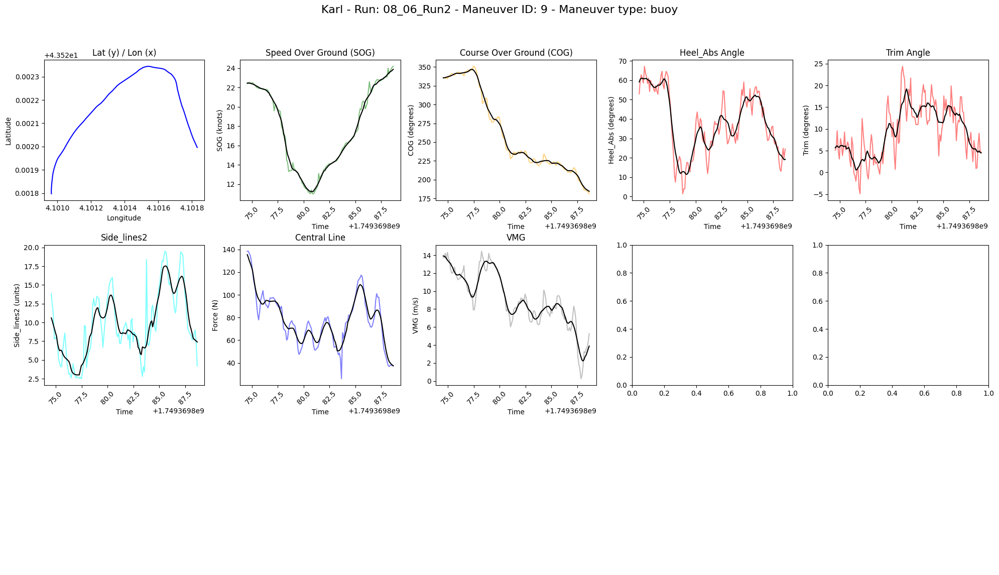


Maneuver details for Maneuver Index: 10
  Maneuver Time: 2025-06-08 08:04:56.559000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749369896.559
  End Time: 1749369910.559
  boat_name: Karl Maeder

avg TWS: 8.69 knots
avg TWA: -69.43 degrees
avg TWD: 287.30 degrees


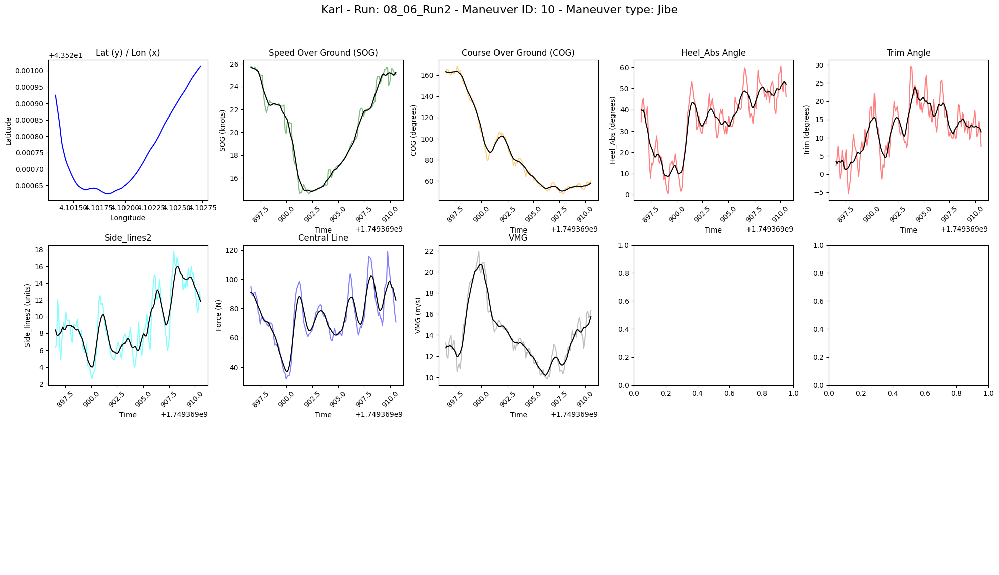


Maneuver details for Maneuver Index: 11
  Maneuver Time: 2025-06-08 08:05:25.262000+00:00
  Maneuver Type: Jibe
  Duration: 13.997999906539915 seconds
  Start Time: 1749369925.262
  End Time: 1749369939.26
  boat_name: Karl Maeder

avg TWS: 9.92 knots
avg TWA: 57.86 degrees
avg TWD: 279.50 degrees


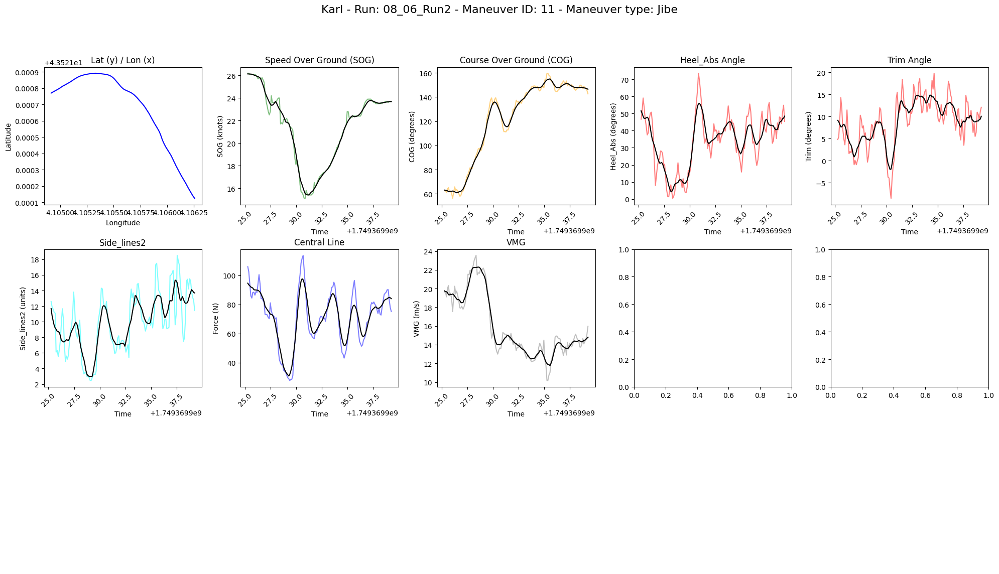


Maneuver details for Maneuver Index: 12
  Maneuver Time: 2025-06-08 08:05:43.461000+00:00
  Maneuver Type: buoy
  Duration: 14.100000143051147 seconds
  Start Time: 1749369943.461
  End Time: 1749369957.561
  boat_name: Karl Maeder

avg TWS: 8.16 knots
avg TWA: 59.24 degrees
avg TWD: 278.02 degrees


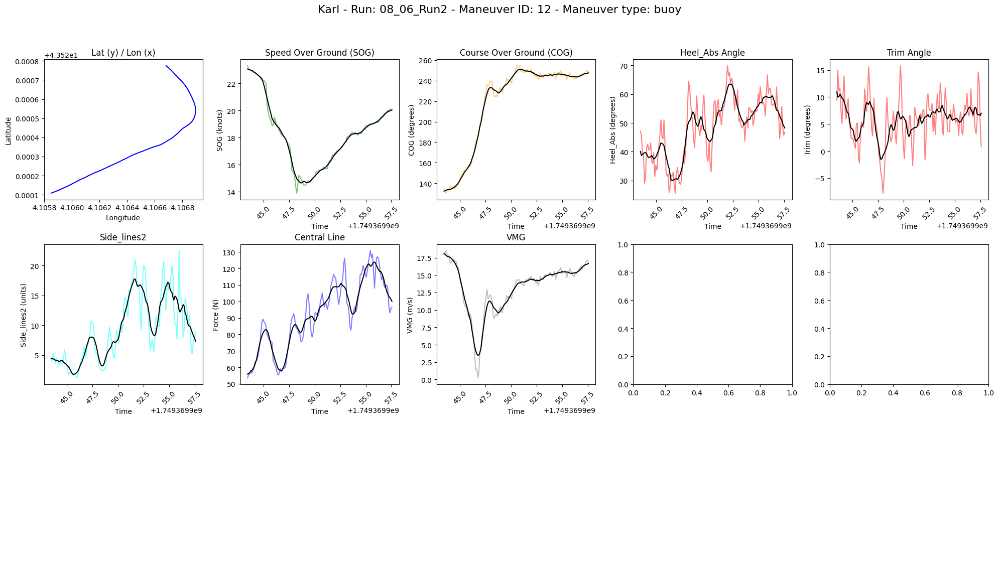

Summary for Karl - Run: 08_06_Run3

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:12:09.062000+00:00
  Maneuver Type: Tack
  Duration: 14.001999855041504 seconds
  Start Time: 1749370329.062
  End Time: 1749370343.064
  boat_name: Karl Maeder

avg TWS: 8.26 knots
avg TWA: -16.73 degrees
avg TWD: 288.44 degrees


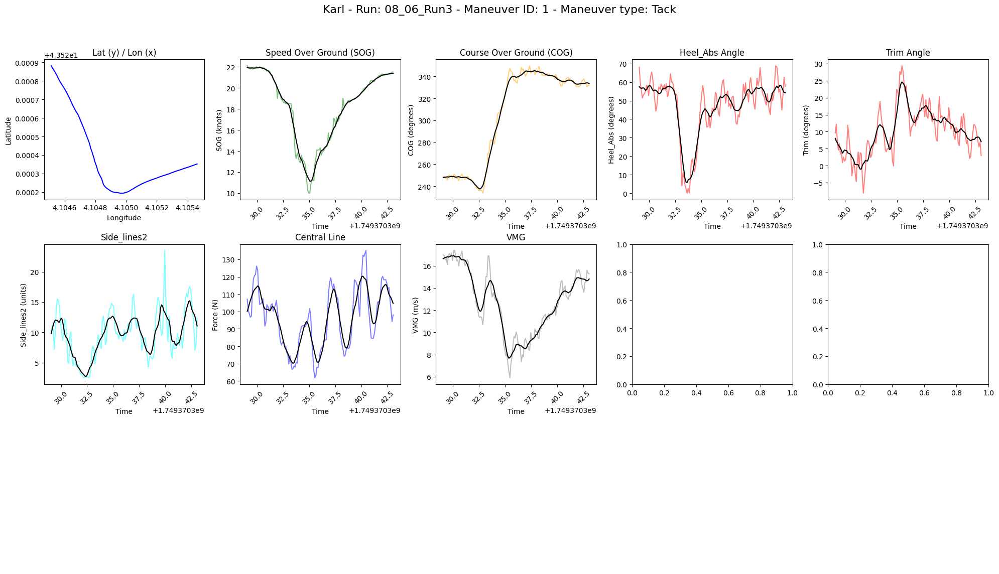


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:12:24.075000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749370344.075
  End Time: 1749370358.075
  boat_name: Karl Maeder

avg TWS: 8.39 knots
avg TWA: 13.93 degrees
avg TWD: 286.72 degrees


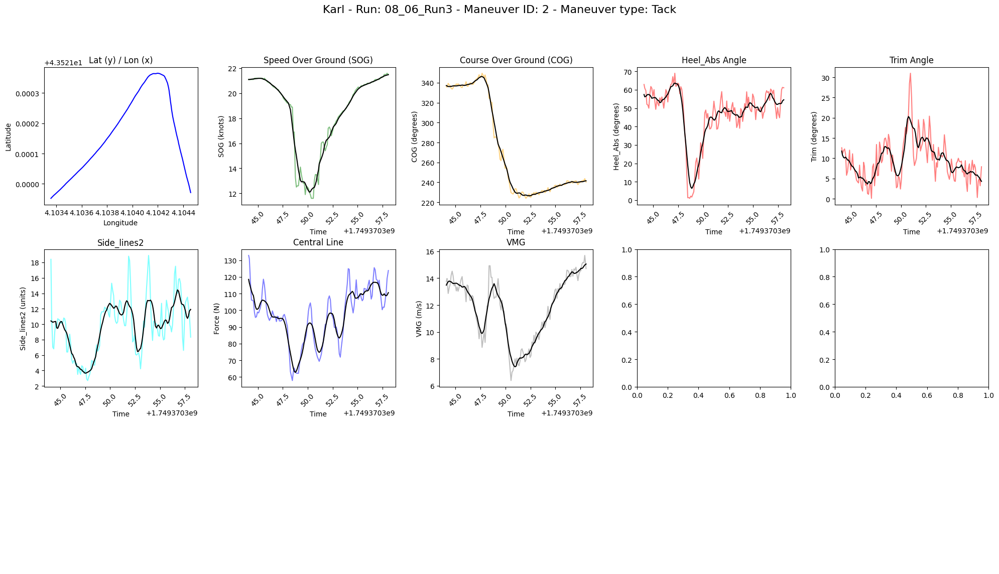


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:12:37.556000+00:00
  Maneuver Type: Tack
  Duration: 14.1010000705719 seconds
  Start Time: 1749370357.556
  End Time: 1749370371.657
  boat_name: Karl Maeder

avg TWS: 8.70 knots
avg TWA: -14.28 degrees
avg TWD: 289.49 degrees


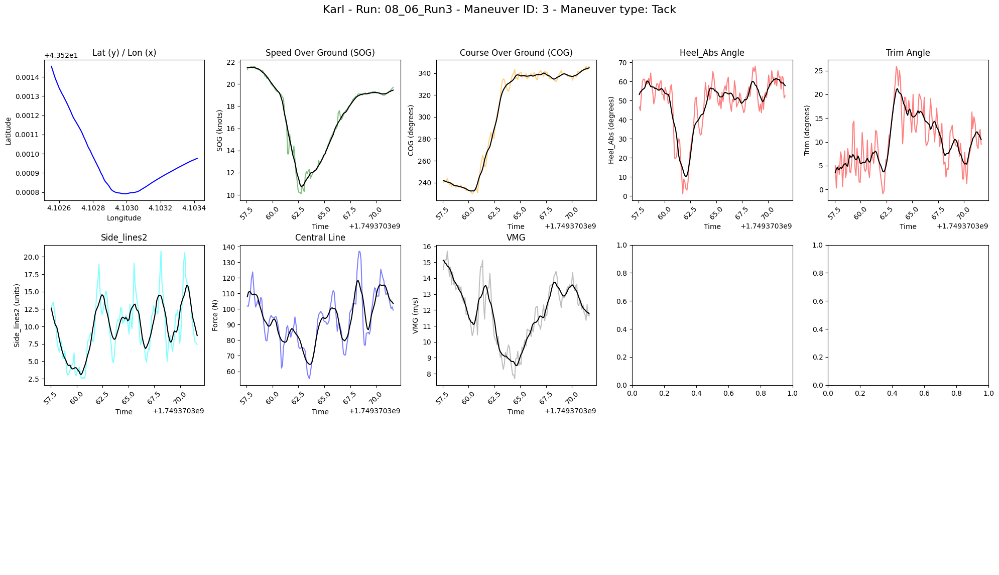


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 08:12:57.158000+00:00
  Maneuver Type: Tack
  Duration: 14.005000114440918 seconds
  Start Time: 1749370377.158
  End Time: 1749370391.163
  boat_name: Karl Maeder

avg TWS: 8.80 knots
avg TWA: 15.49 degrees
avg TWD: 291.90 degrees


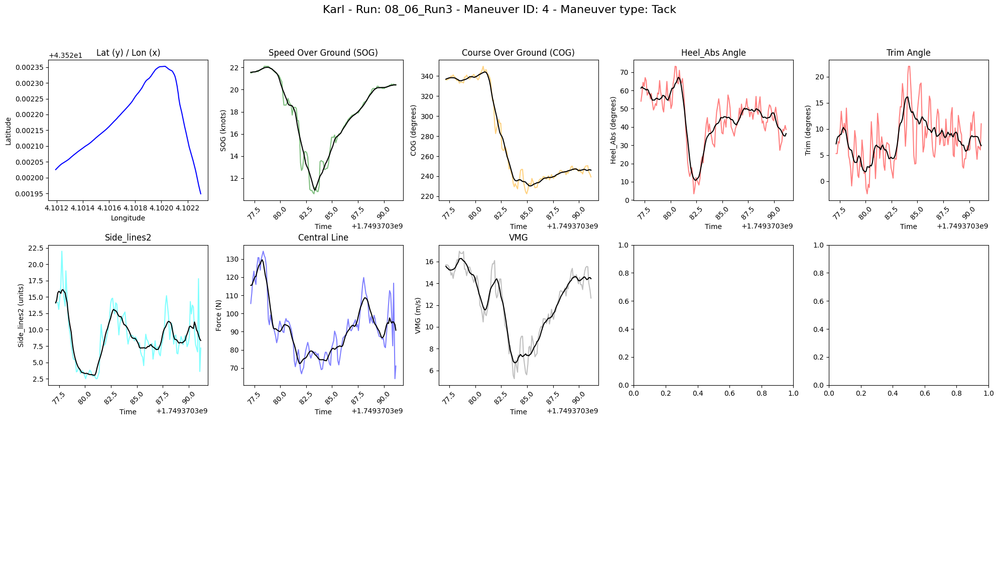


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-08 08:13:21.556000+00:00
  Maneuver Type: Jibe
  Duration: 14.003000020980837 seconds
  Start Time: 1749370401.556
  End Time: 1749370415.559
  boat_name: Karl Maeder

avg TWS: 8.31 knots
avg TWA: -61.56 degrees
avg TWD: 289.73 degrees


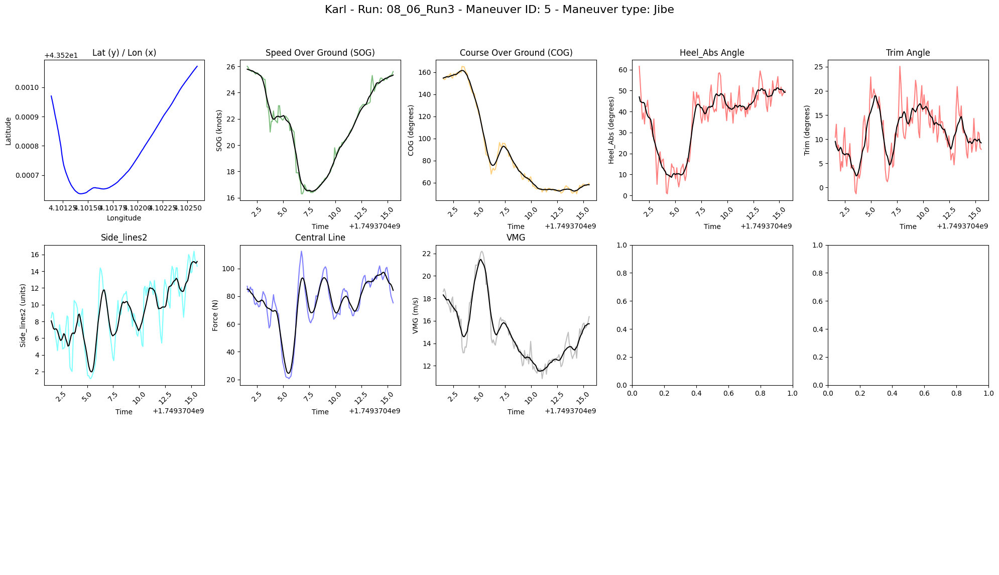


Maneuver details for Maneuver Index: 6
  Maneuver Time: 2025-06-08 08:13:51.757000+00:00
  Maneuver Type: Jibe
  Duration: 14.101999998092651 seconds
  Start Time: 1749370431.757
  End Time: 1749370445.859
  boat_name: Karl Maeder

avg TWS: 8.16 knots
avg TWA: 31.78 degrees
avg TWD: 288.19 degrees


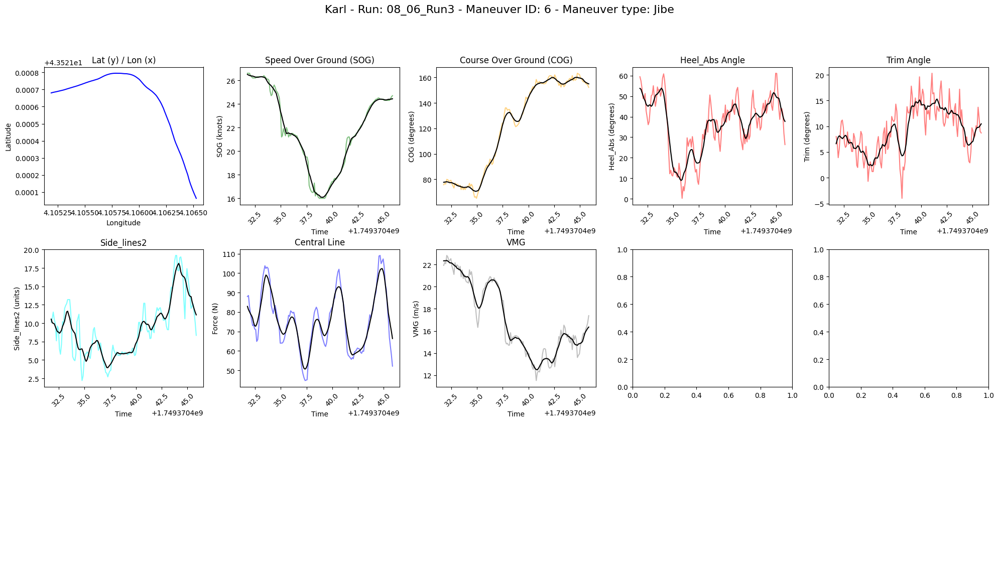


Maneuver details for Maneuver Index: 7
  Maneuver Time: 2025-06-08 08:14:23.558000+00:00
  Maneuver Type: Tack
  Duration: 14.099999904632568 seconds
  Start Time: 1749370463.558
  End Time: 1749370477.658
  boat_name: Karl Maeder

avg TWS: 8.75 knots
avg TWA: -21.83 degrees
avg TWD: 288.07 degrees


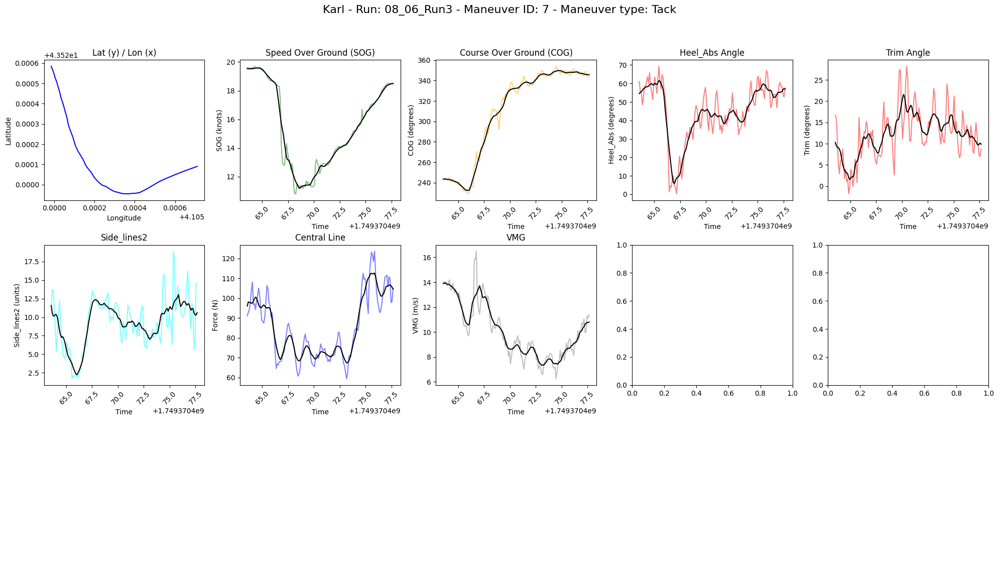


Maneuver details for Maneuver Index: 8
  Maneuver Time: 2025-06-08 08:14:42.956000+00:00
  Maneuver Type: Tack
  Duration: 14.000999927520752 seconds
  Start Time: 1749370482.956
  End Time: 1749370496.957
  boat_name: Karl Maeder

avg TWS: 8.73 knots
avg TWA: 24.12 degrees
avg TWD: 292.49 degrees


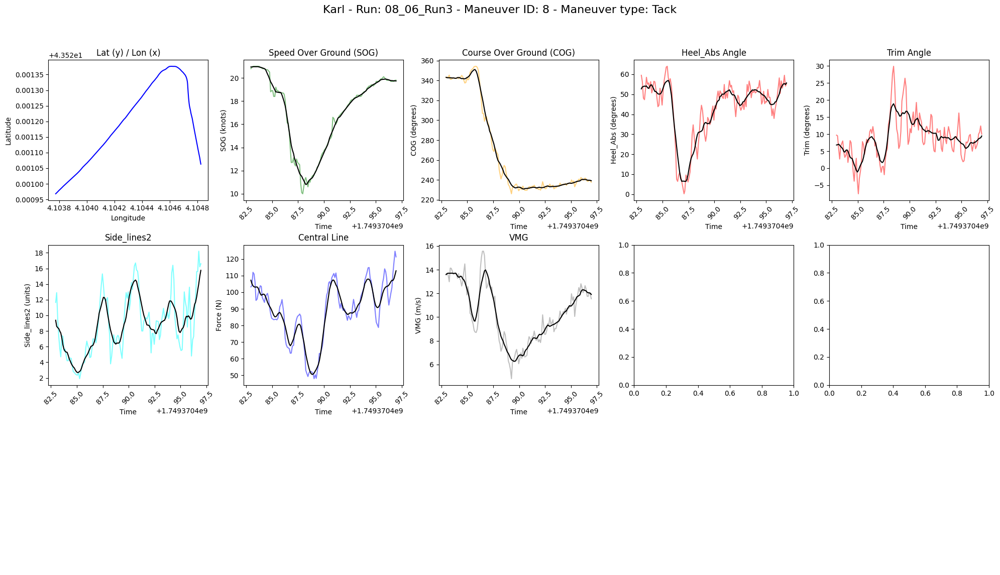


Maneuver details for Maneuver Index: 9
  Maneuver Time: 2025-06-08 08:15:00.360000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749370500.36
  End Time: 1749370514.36
  boat_name: Karl Maeder

avg TWS: 7.83 knots
avg TWA: -22.13 degrees
avg TWD: 291.29 degrees


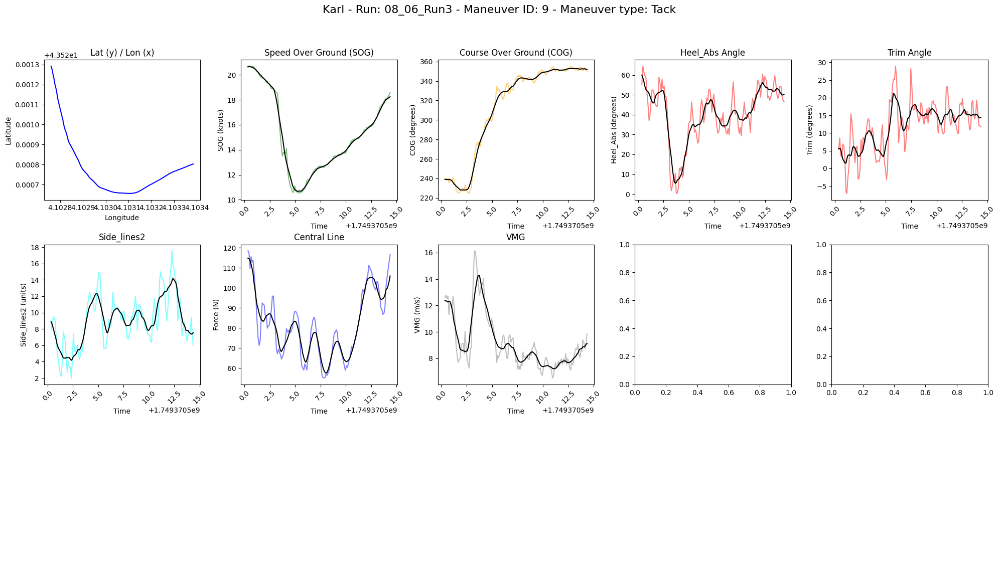


Maneuver details for Maneuver Index: 10
  Maneuver Time: 2025-06-08 08:15:21.459000+00:00
  Maneuver Type: Tack
  Duration: 14.000999927520752 seconds
  Start Time: 1749370521.459
  End Time: 1749370535.46
  boat_name: Karl Maeder

avg TWS: 8.71 knots
avg TWA: 17.49 degrees
avg TWD: 293.73 degrees


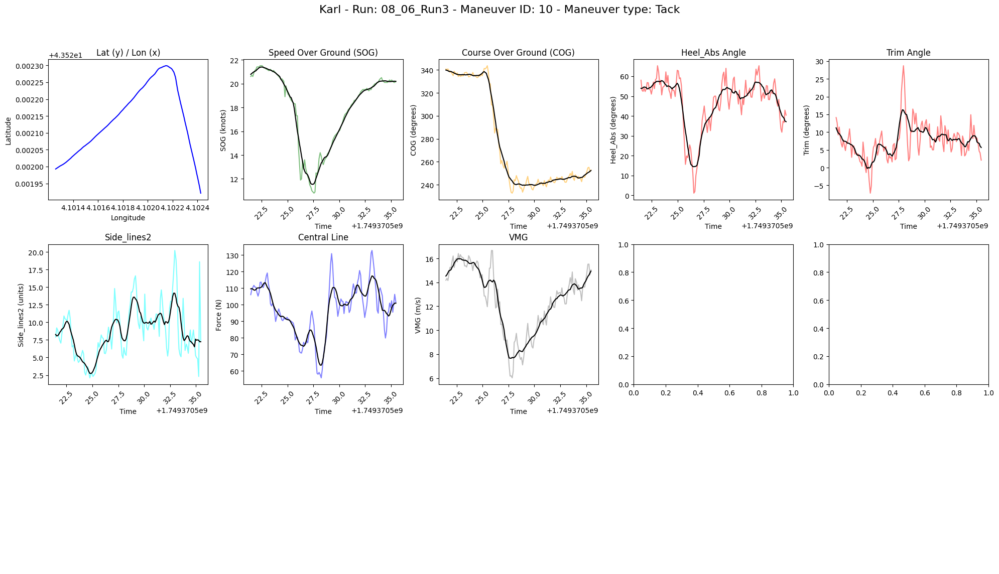


Maneuver details for Maneuver Index: 11
  Maneuver Time: 2025-06-08 08:15:47.260000+00:00
  Maneuver Type: Jibe
  Duration: 14.002000093460085 seconds
  Start Time: 1749370547.26
  End Time: 1749370561.262
  boat_name: Karl Maeder

avg TWS: 7.65 knots
avg TWA: -61.69 degrees
avg TWD: 294.76 degrees


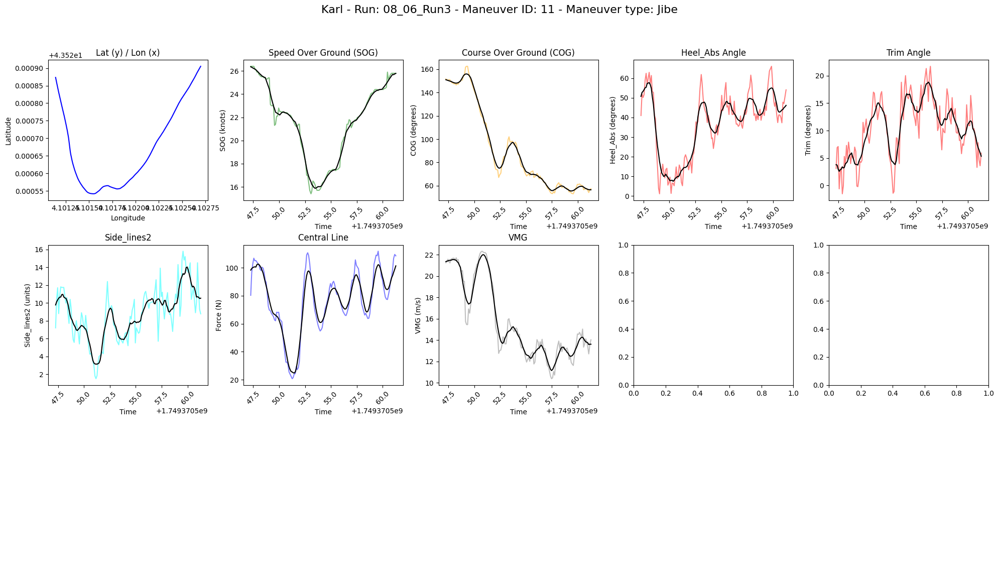


Maneuver details for Maneuver Index: 12
  Maneuver Time: 2025-06-08 08:16:16.859000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749370576.859
  End Time: 1749370590.859
  boat_name: Karl Maeder

avg TWS: 7.45 knots
avg TWA: 48.12 degrees
avg TWD: 285.22 degrees


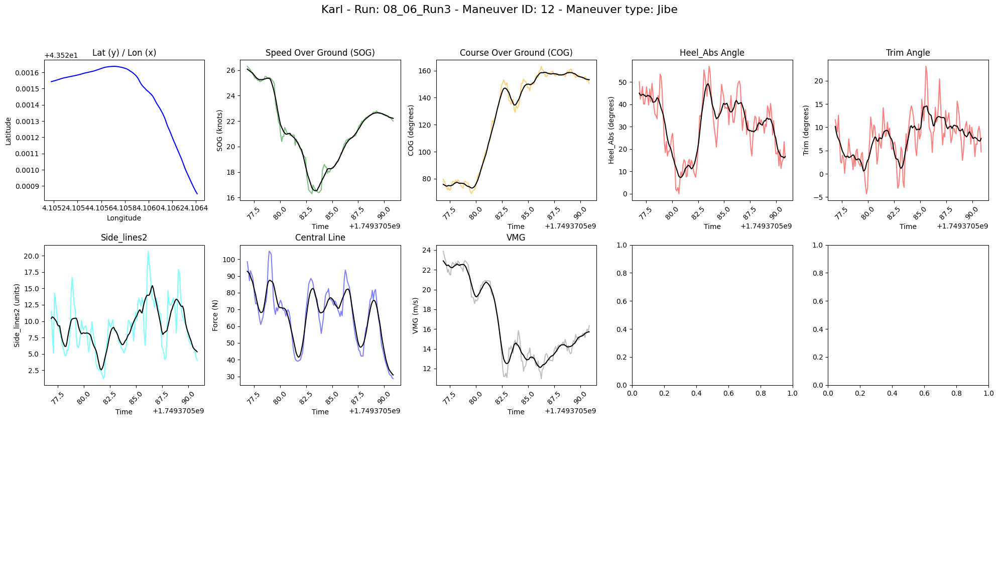


Maneuver details for Maneuver Index: 13
  Maneuver Time: 2025-06-08 08:16:31.859000+00:00
  Maneuver Type: buoy
  Duration: 14.101999998092651 seconds
  Start Time: 1749370591.859
  End Time: 1749370605.961
  boat_name: Karl Maeder

avg TWS: 8.39 knots
avg TWA: 91.89 degrees
avg TWD: 290.60 degrees


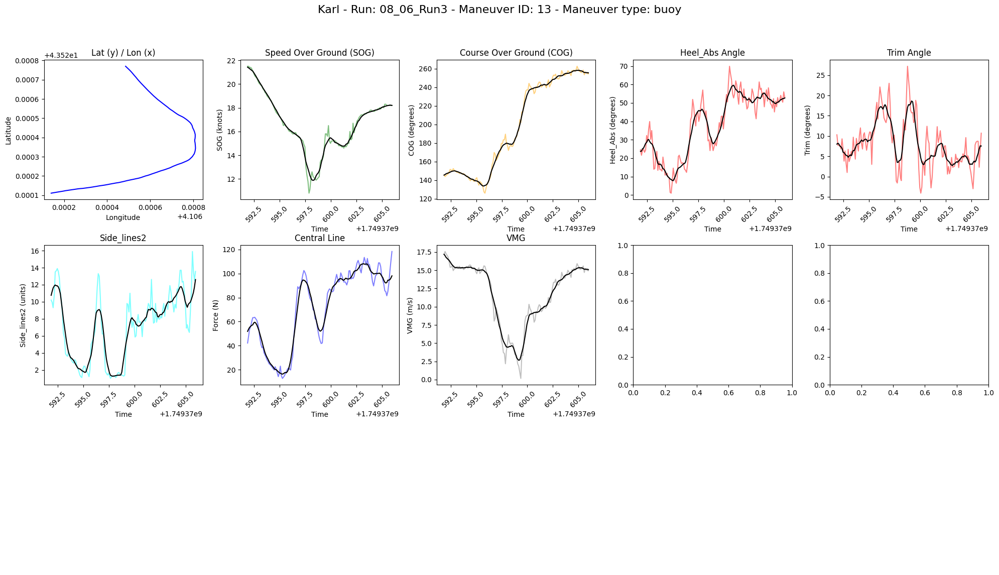

Summary for Karl - Run: 08_06_Run4

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:21:42.075000+00:00
  Maneuver Type: Tack
  Duration: 14.08899998664856 seconds
  Start Time: 1749370902.075
  End Time: 1749370916.164
  boat_name: Karl Maeder

avg TWS: 7.70 knots
avg TWA: -8.15 degrees
avg TWD: 302.30 degrees


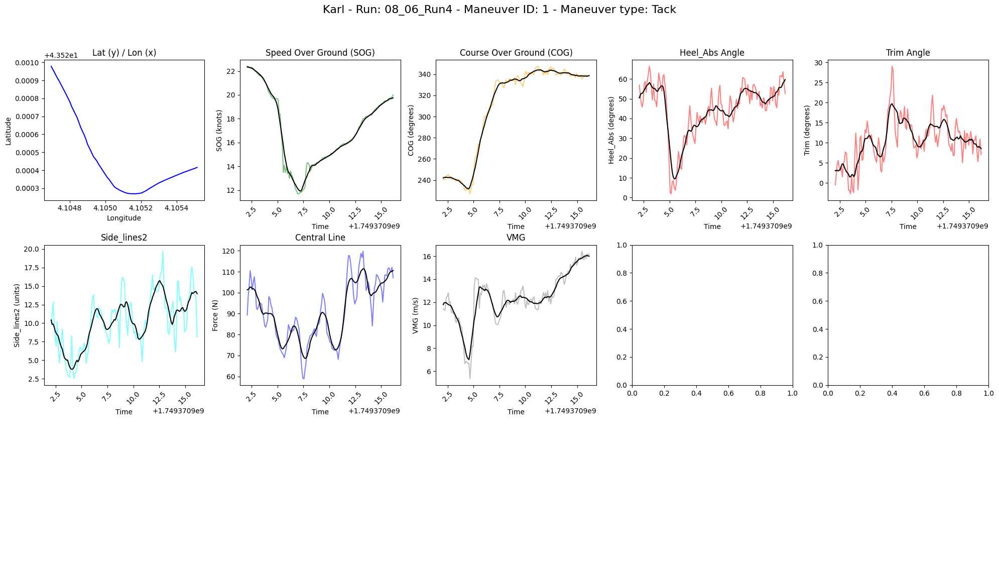


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:21:57.959000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749370917.959
  End Time: 1749370931.959
  boat_name: Karl Maeder

avg TWS: 7.33 knots
avg TWA: 23.73 degrees
avg TWD: 301.26 degrees


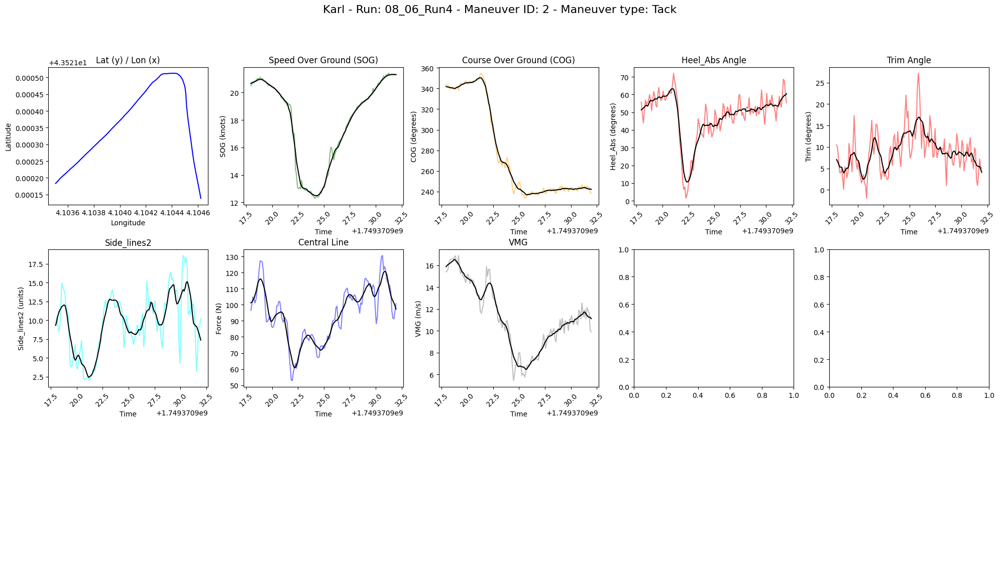


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:22:11.360000+00:00
  Maneuver Type: Tack
  Duration: 13.998000144958496 seconds
  Start Time: 1749370931.36
  End Time: 1749370945.358
  boat_name: Karl Maeder

avg TWS: 7.17 knots
avg TWA: -14.70 degrees
avg TWD: 302.62 degrees


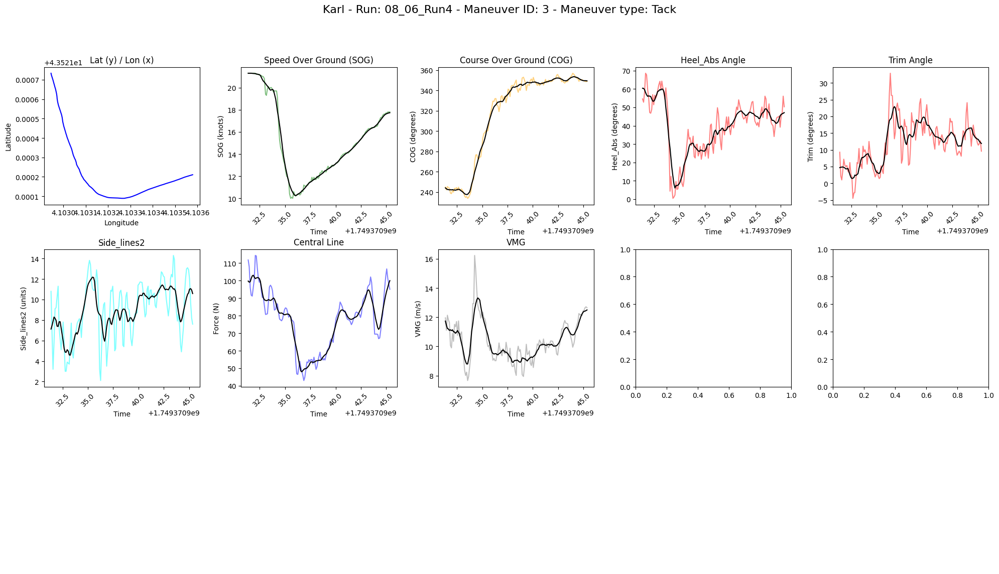


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 08:22:29.360000+00:00
  Maneuver Type: Tack
  Duration: 13.999000072479248 seconds
  Start Time: 1749370949.36
  End Time: 1749370963.359
  boat_name: Karl Maeder

avg TWS: 8.35 knots
avg TWA: 29.45 degrees
avg TWD: 303.44 degrees


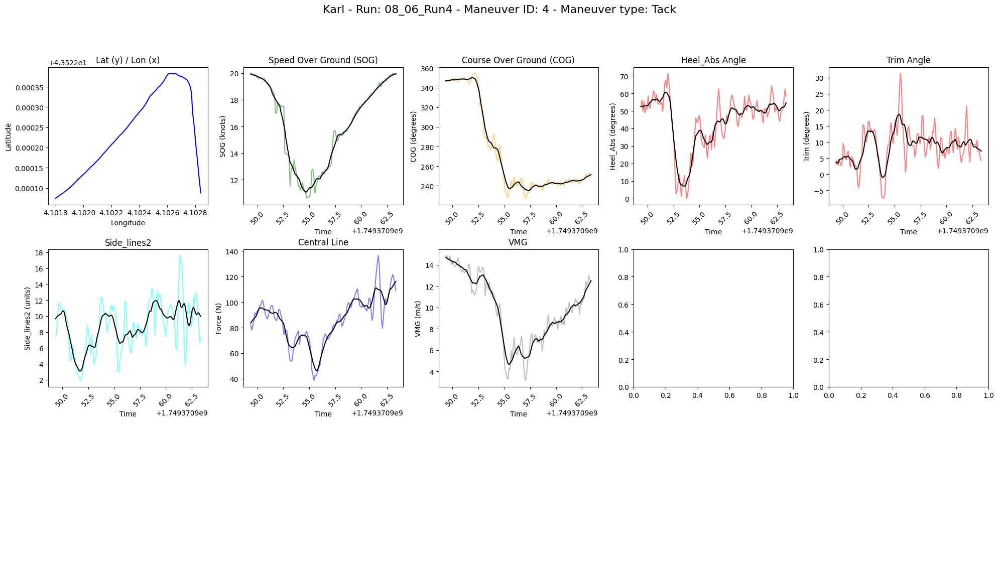


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-08 08:23:01.563000+00:00
  Maneuver Type: Jibe
  Duration: 13.998000144958496 seconds
  Start Time: 1749370981.563
  End Time: 1749370995.561
  boat_name: Karl Maeder

avg TWS: 6.48 knots
avg TWA: -42.98 degrees
avg TWD: 302.83 degrees


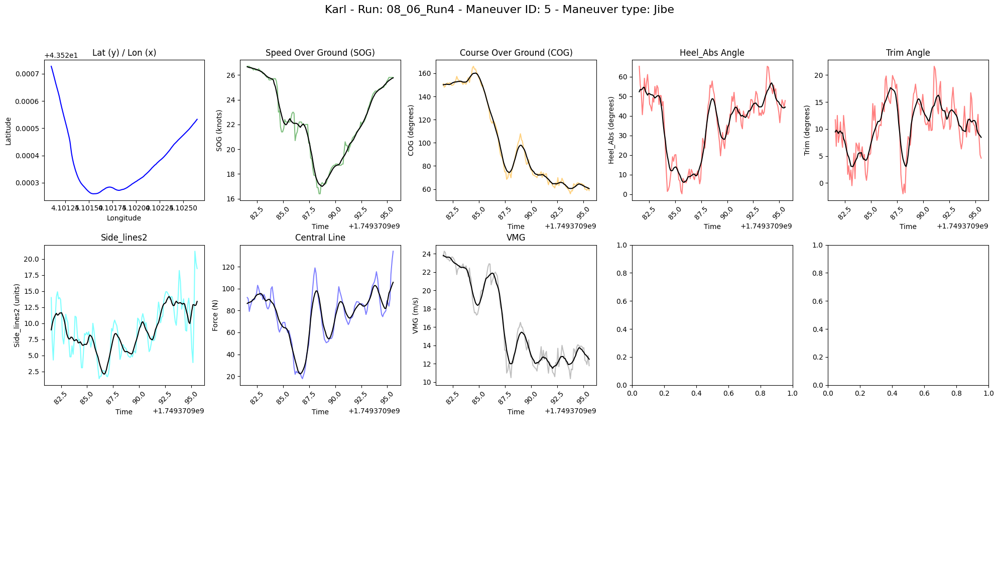


Maneuver details for Maneuver Index: 6
  Maneuver Time: 2025-06-08 08:23:47.859000+00:00
  Maneuver Type: buoy
  Duration: 13.999000072479248 seconds
  Start Time: 1749371027.859
  End Time: 1749371041.858
  boat_name: Karl Maeder

avg TWS: 9.14 knots
avg TWA: 97.16 degrees
avg TWD: 297.73 degrees


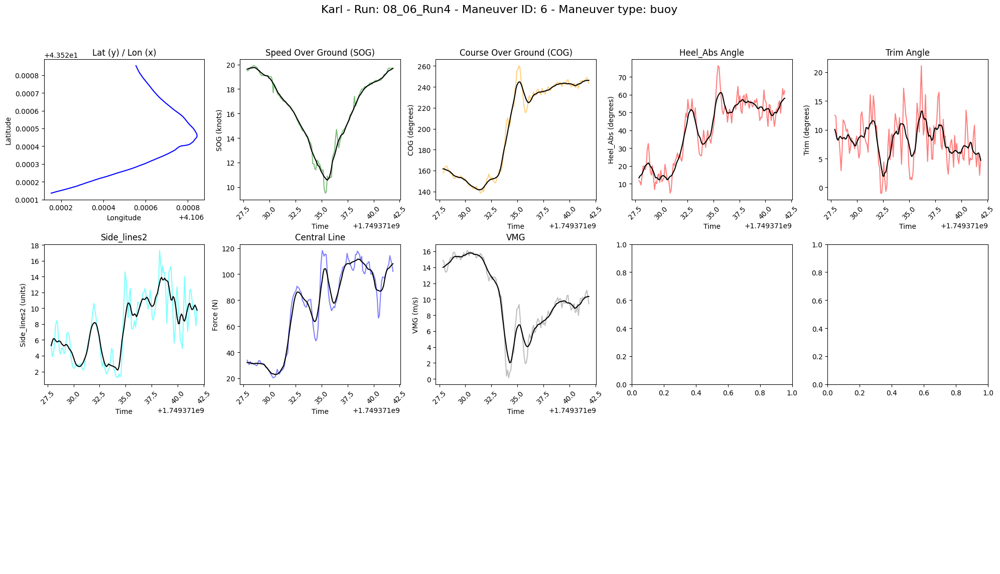


Maneuver details for Maneuver Index: 7
  Maneuver Time: 2025-06-08 08:24:05.164000+00:00
  Maneuver Type: Tack
  Duration: 13.999000072479248 seconds
  Start Time: 1749371045.164
  End Time: 1749371059.163
  boat_name: Karl Maeder

avg TWS: 7.59 knots
avg TWA: 1.71 degrees
avg TWD: 304.00 degrees


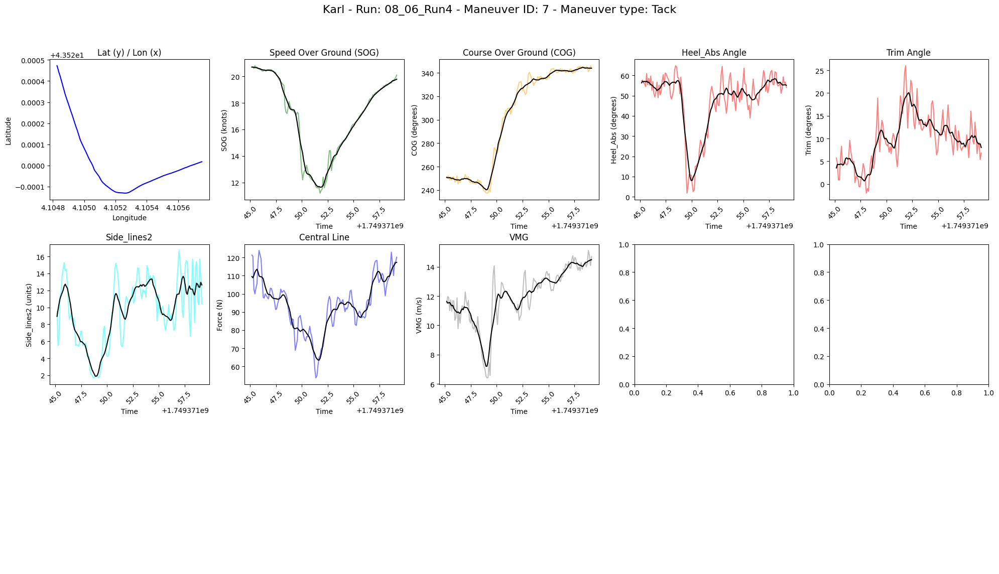


Maneuver details for Maneuver Index: 8
  Maneuver Time: 2025-06-08 08:24:21.558000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749371061.558
  End Time: 1749371075.558
  boat_name: Karl Maeder

avg TWS: 7.86 knots
avg TWA: 30.68 degrees
avg TWD: 301.22 degrees


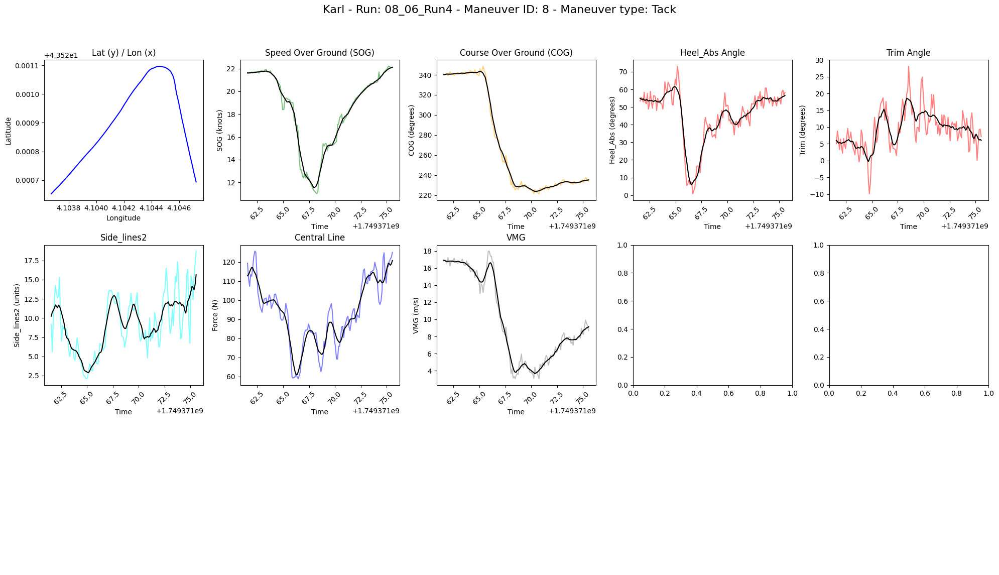


Maneuver details for Maneuver Index: 9
  Maneuver Time: 2025-06-08 08:24:37.560000+00:00
  Maneuver Type: Tack
  Duration: 14.098000049591064 seconds
  Start Time: 1749371077.56
  End Time: 1749371091.658
  boat_name: Karl Maeder

avg TWS: 7.65 knots
avg TWA: -12.33 degrees
avg TWD: 298.40 degrees


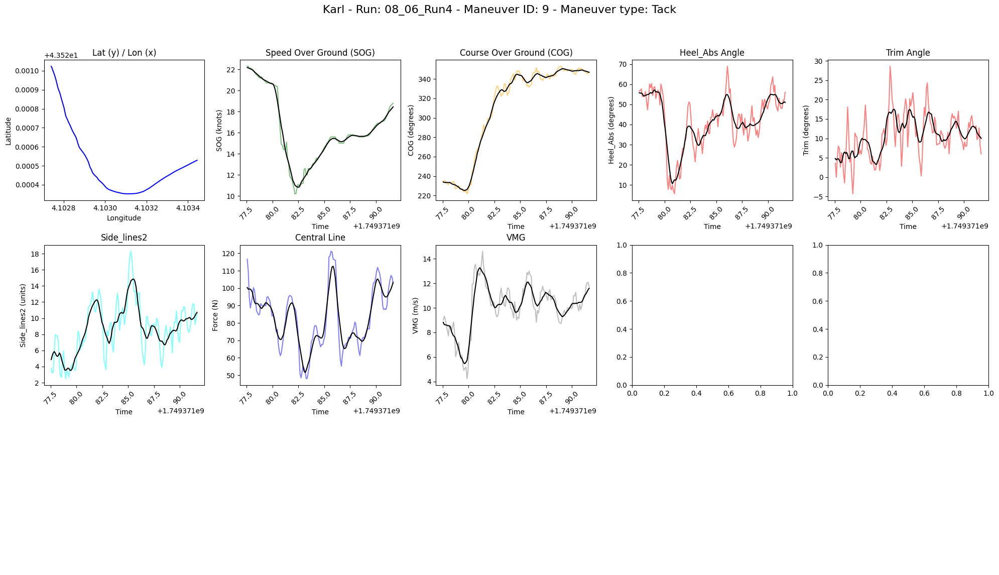


Maneuver details for Maneuver Index: 10
  Maneuver Time: 2025-06-08 08:25:02.860000+00:00
  Maneuver Type: Tack
  Duration: 14.099000215530396 seconds
  Start Time: 1749371102.86
  End Time: 1749371116.959
  boat_name: Karl Maeder

avg TWS: 6.58 knots
avg TWA: 17.80 degrees
avg TWD: 291.85 degrees


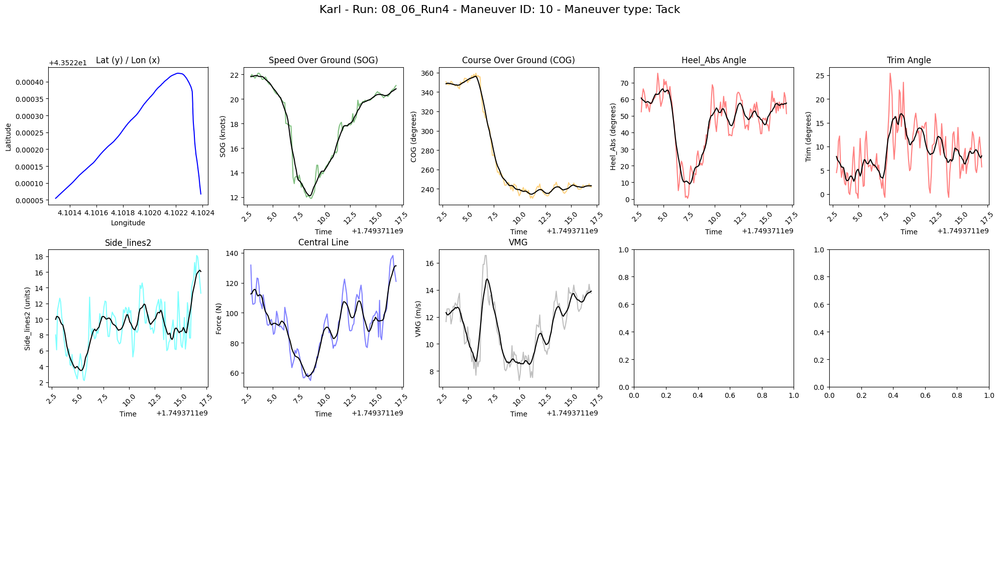


Maneuver details for Maneuver Index: 11
  Maneuver Time: 2025-06-08 08:25:33.560000+00:00
  Maneuver Type: Jibe
  Duration: 13.999000072479248 seconds
  Start Time: 1749371133.56
  End Time: 1749371147.559
  boat_name: Karl Maeder

avg TWS: 8.27 knots
avg TWA: -73.02 degrees
avg TWD: 285.25 degrees


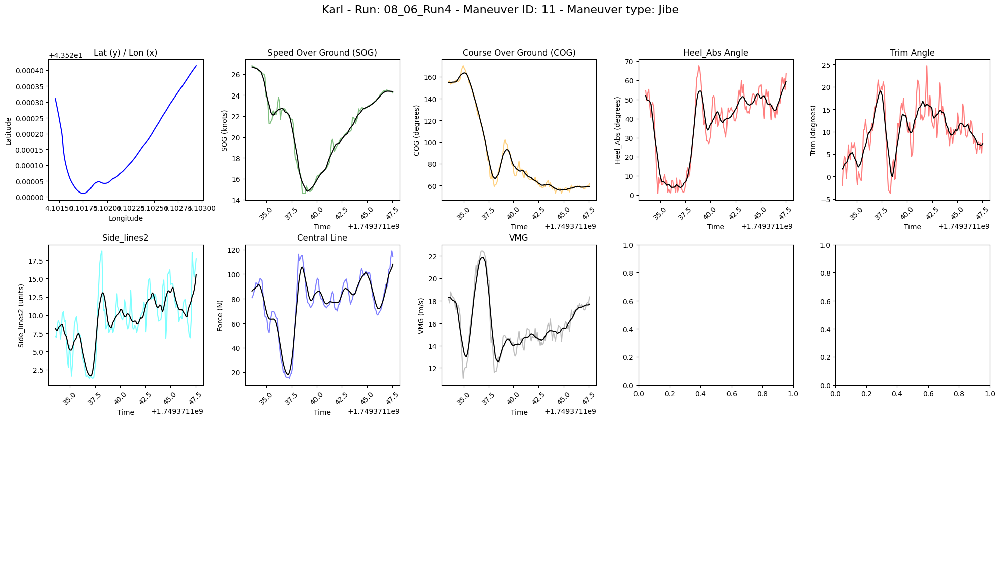


Maneuver details for Maneuver Index: 12
  Maneuver Time: 2025-06-08 08:26:05.859000+00:00
  Maneuver Type: Jibe
  Duration: 13.999000072479248 seconds
  Start Time: 1749371165.859
  End Time: 1749371179.858
  boat_name: Karl Maeder

avg TWS: 7.40 knots
avg TWA: 46.28 degrees
avg TWD: 281.68 degrees


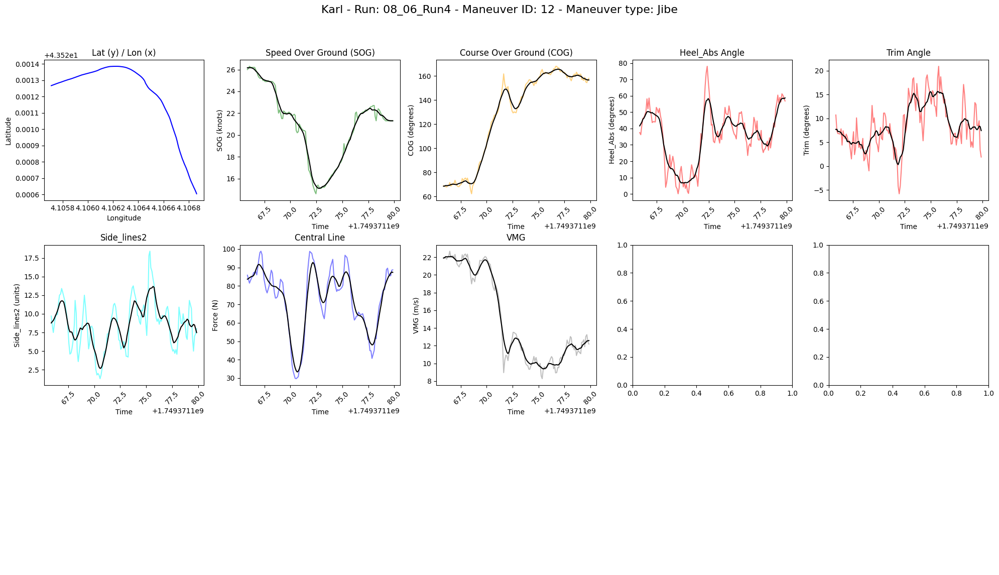

Summary for Karl - Run: 08_06_Run5

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:32:22.263000+00:00
  Maneuver Type: Tack
  Duration: 13.996999979019163 seconds
  Start Time: 1749371542.263
  End Time: 1749371556.26
  boat_name: Karl Maeder

avg TWS: 5.88 knots
avg TWA: -22.53 degrees
avg TWD: 288.40 degrees


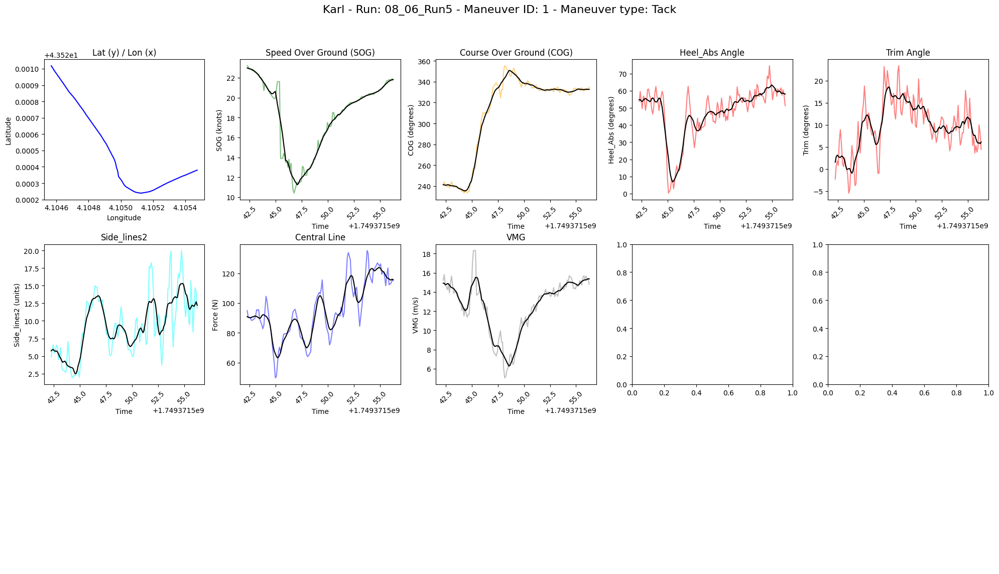


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:32:36.460000+00:00
  Maneuver Type: Tack
  Duration: 14.09599995613098 seconds
  Start Time: 1749371556.46
  End Time: 1749371570.556
  boat_name: Karl Maeder

avg TWS: 7.20 knots
avg TWA: 19.15 degrees
avg TWD: 289.45 degrees


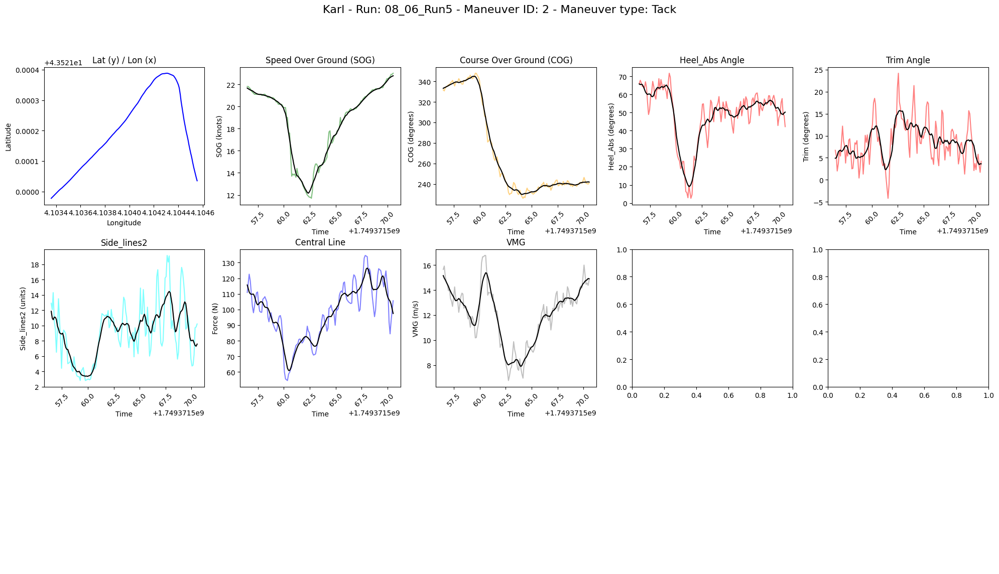


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:32:51.157000+00:00
  Maneuver Type: Tack
  Duration: 13.99399995803833 seconds
  Start Time: 1749371571.157
  End Time: 1749371585.151
  boat_name: Karl Maeder

avg TWS: 8.38 knots
avg TWA: -27.30 degrees
avg TWD: 288.66 degrees


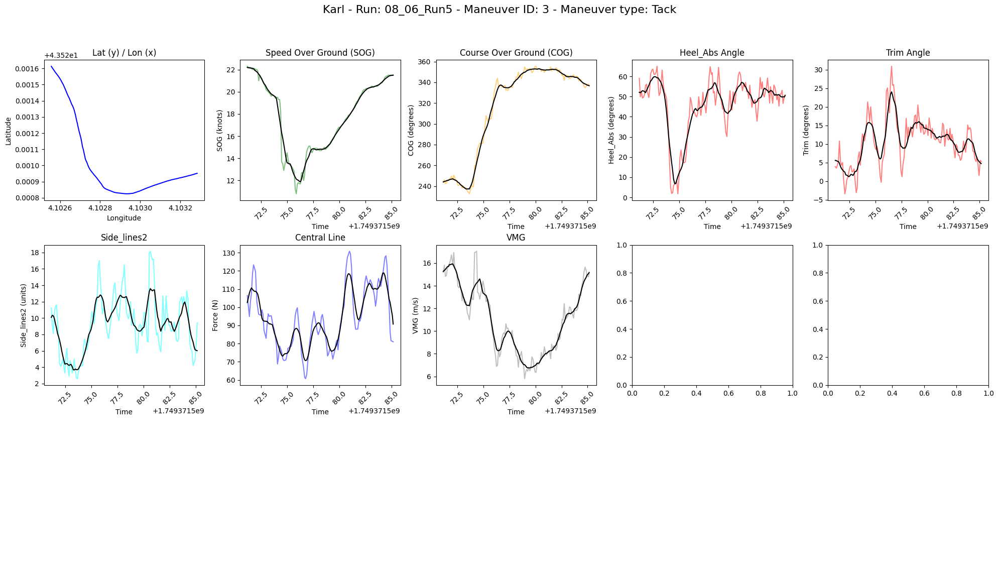


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 08:33:08.858000+00:00
  Maneuver Type: Tack
  Duration: 14.1010000705719 seconds
  Start Time: 1749371588.858
  End Time: 1749371602.959
  boat_name: Karl Maeder

avg TWS: 8.02 knots
avg TWA: 17.59 degrees
avg TWD: 296.97 degrees


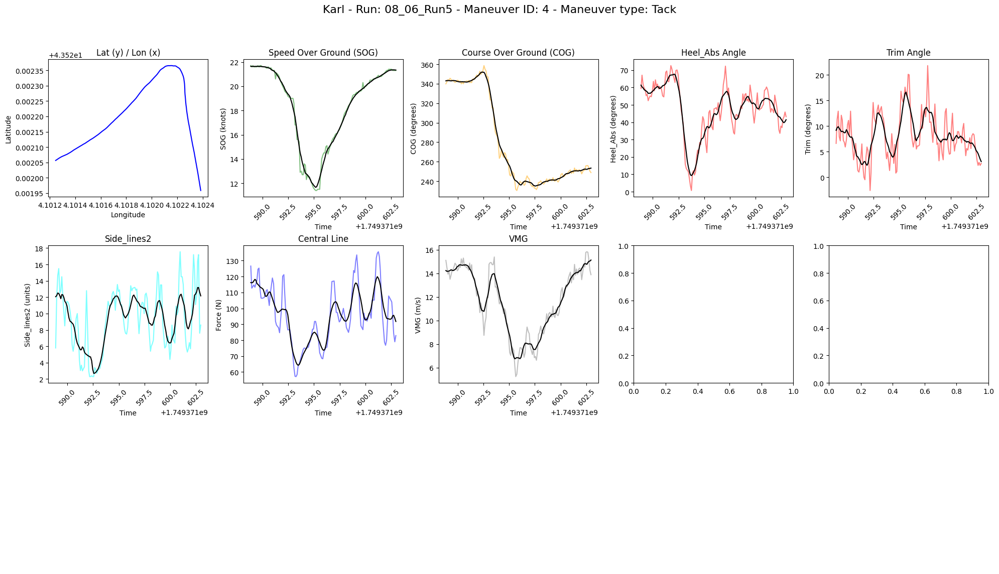


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-08 08:33:35.757000+00:00
  Maneuver Type: Jibe
  Duration: 13.999000072479248 seconds
  Start Time: 1749371615.757
  End Time: 1749371629.756
  boat_name: Karl Maeder

avg TWS: 7.01 knots
avg TWA: -59.64 degrees
avg TWD: 294.53 degrees


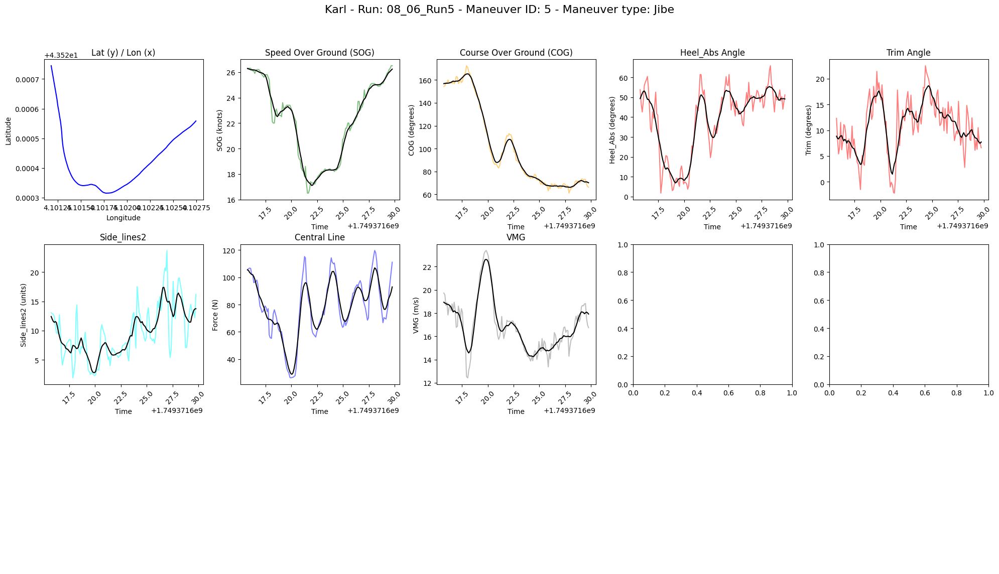


Maneuver details for Maneuver Index: 6
  Maneuver Time: 2025-06-08 08:34:46.956000+00:00
  Maneuver Type: Tack
  Duration: 14.003000020980837 seconds
  Start Time: 1749371686.956
  End Time: 1749371700.959
  boat_name: Karl Maeder

avg TWS: 8.46 knots
avg TWA: -24.56 degrees
avg TWD: 292.36 degrees


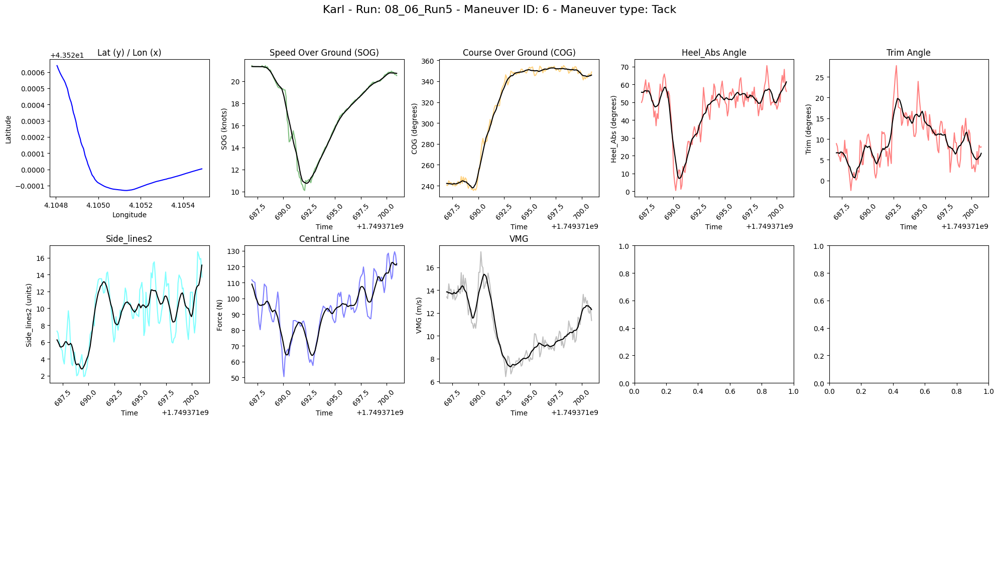


Maneuver details for Maneuver Index: 7
  Maneuver Time: 2025-06-08 08:35:02.860000+00:00
  Maneuver Type: Tack
  Duration: 13.999000072479248 seconds
  Start Time: 1749371702.86
  End Time: 1749371716.859
  boat_name: Karl Maeder

avg TWS: 8.25 knots
avg TWA: 11.79 degrees
avg TWD: 294.69 degrees


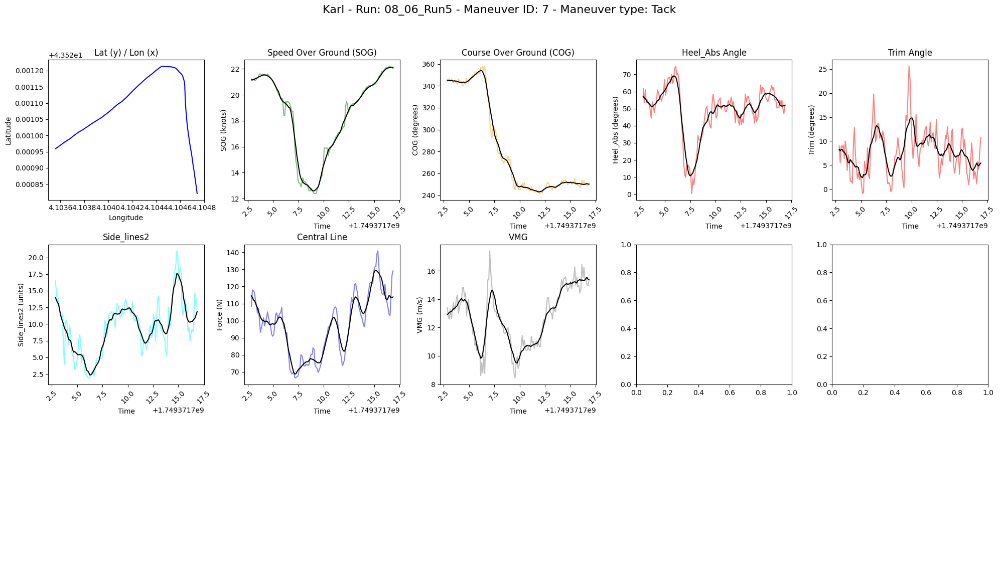


Maneuver details for Maneuver Index: 8
  Maneuver Time: 2025-06-08 08:35:17.858000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749371717.858
  End Time: 1749371731.858
  boat_name: Karl Maeder

avg TWS: 8.00 knots
avg TWA: -27.47 degrees
avg TWD: 296.78 degrees


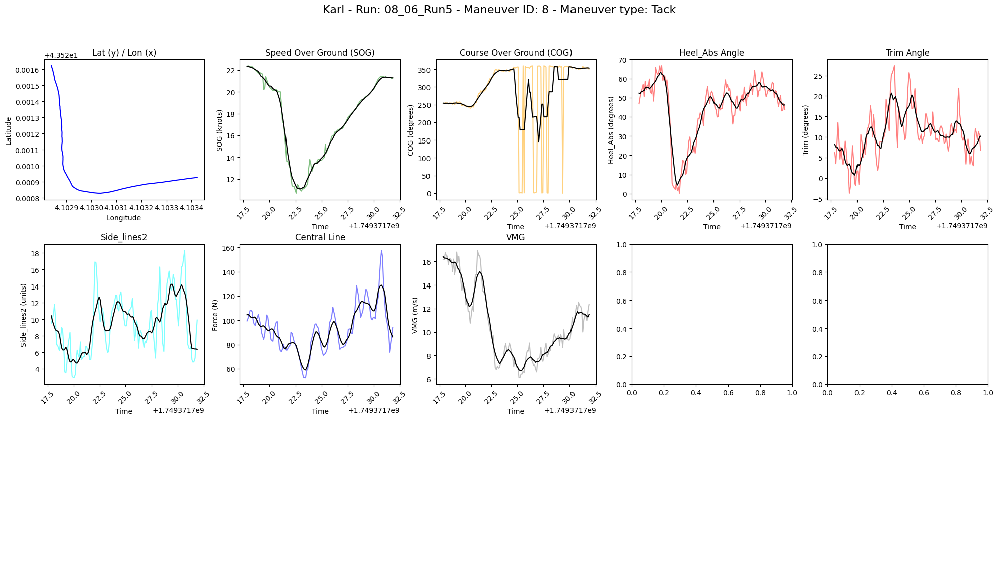


Maneuver details for Maneuver Index: 9
  Maneuver Time: 2025-06-08 08:35:35.556000+00:00
  Maneuver Type: Tack
  Duration: 13.903000116348268 seconds
  Start Time: 1749371735.556
  End Time: 1749371749.459
  boat_name: Karl Maeder

avg TWS: 7.73 knots
avg TWA: 34.20 degrees
avg TWD: 295.38 degrees


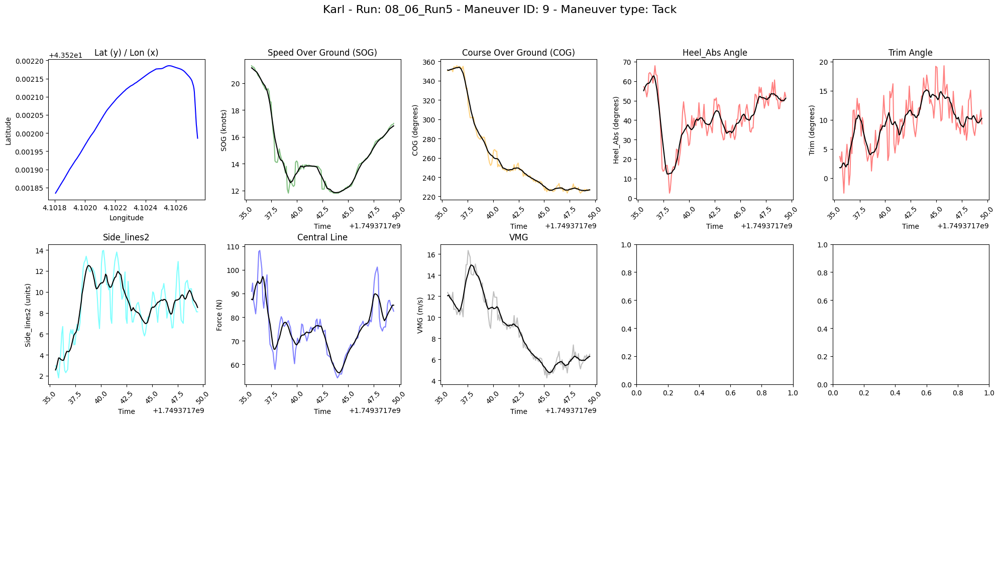


Maneuver details for Maneuver Index: 10
  Maneuver Time: 2025-06-08 08:36:24.558000+00:00
  Maneuver Type: Jibe
  Duration: 13.997999906539915 seconds
  Start Time: 1749371784.558
  End Time: 1749371798.556
  boat_name: Karl Maeder

avg TWS: 6.97 knots
avg TWA: -68.43 degrees
avg TWD: 309.05 degrees


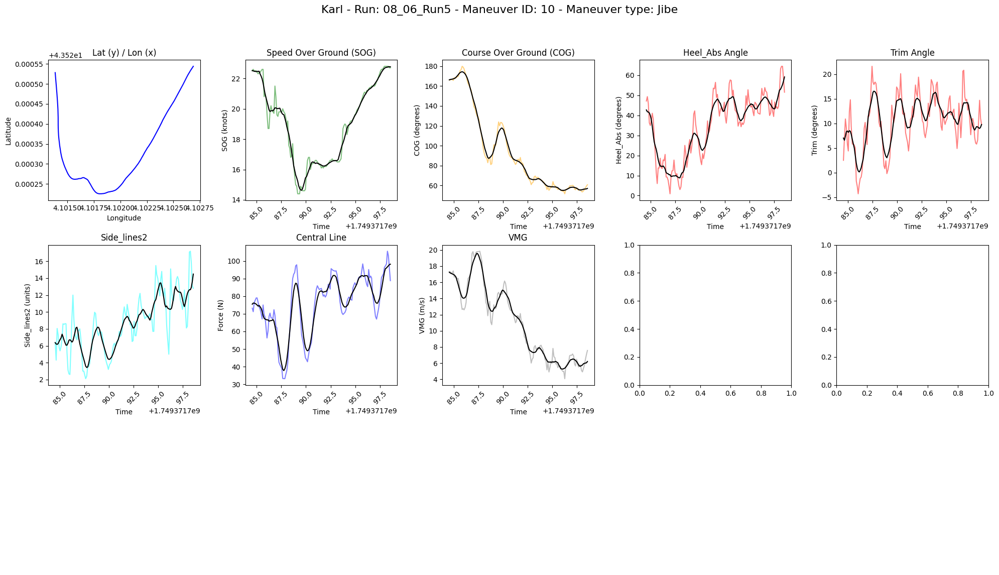


Maneuver details for Maneuver Index: 11
  Maneuver Time: 2025-06-08 08:36:57.756000+00:00
  Maneuver Type: Jibe
  Duration: 14.003000020980837 seconds
  Start Time: 1749371817.756
  End Time: 1749371831.759
  boat_name: Karl Maeder

avg TWS: 7.84 knots
avg TWA: 68.31 degrees
avg TWD: 302.72 degrees


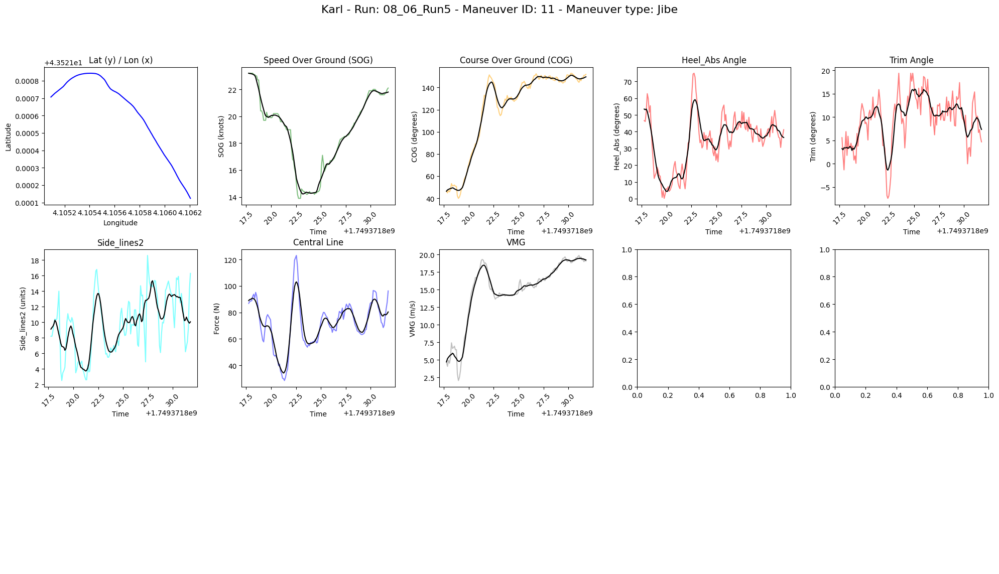


Maneuver details for Maneuver Index: 12
  Maneuver Time: 2025-06-08 08:37:16.756000+00:00
  Maneuver Type: buoy
  Duration: 14.000999927520752 seconds
  Start Time: 1749371836.756
  End Time: 1749371850.757
  boat_name: Karl Maeder

avg TWS: 5.88 knots
avg TWA: 85.10 degrees
avg TWD: 301.65 degrees


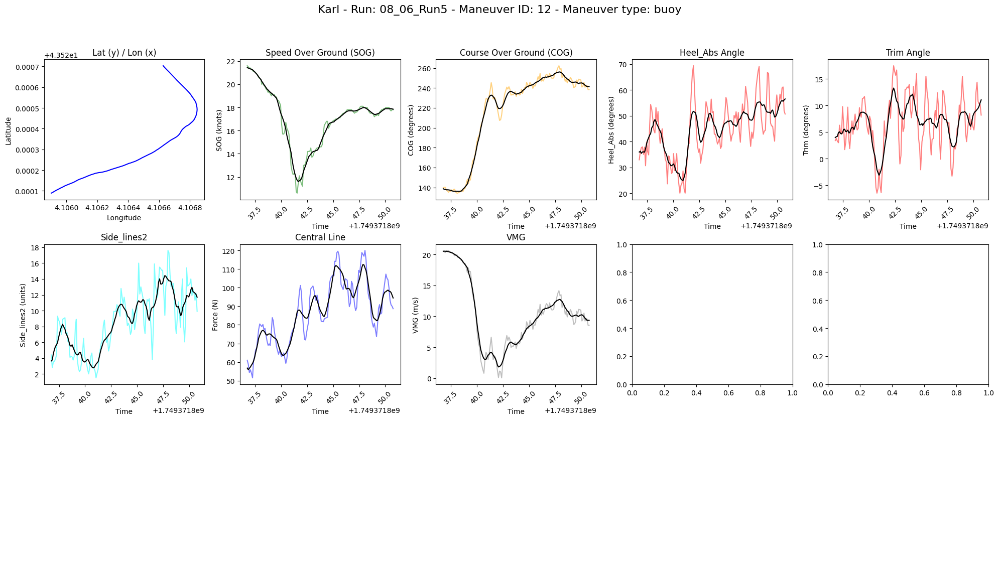

Summary for Karl - Run: 08_06_Run6

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:44:10.259000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749372250.259
  End Time: 1749372264.259
  boat_name: Karl Maeder

avg TWS: 6.61 knots
avg TWA: -14.83 degrees
avg TWD: 293.57 degrees


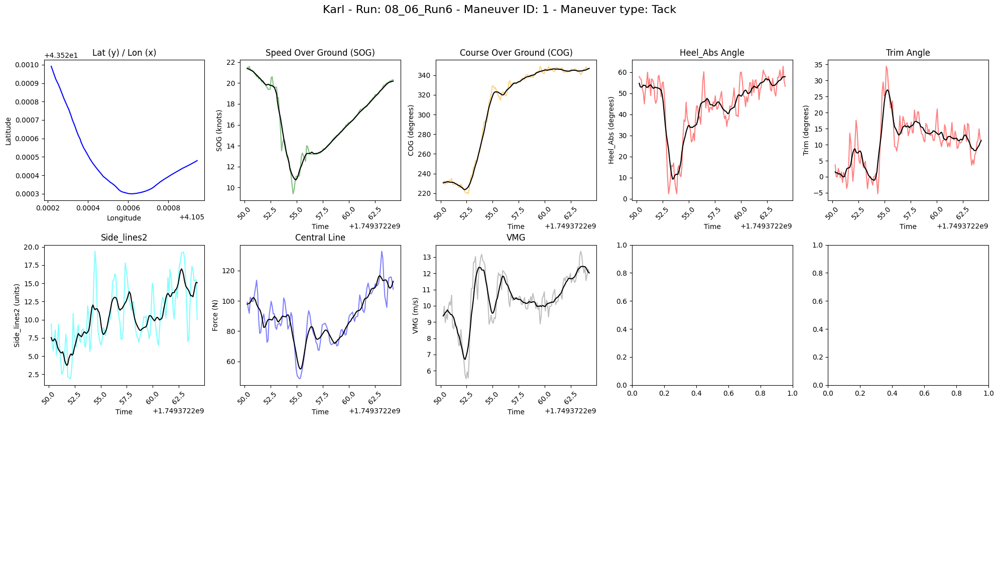


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:44:27.956000+00:00
  Maneuver Type: Tack
  Duration: 14.0 seconds
  Start Time: 1749372267.956
  End Time: 1749372281.956
  boat_name: Karl Maeder

avg TWS: 8.18 knots
avg TWA: 35.99 degrees
avg TWD: 300.03 degrees


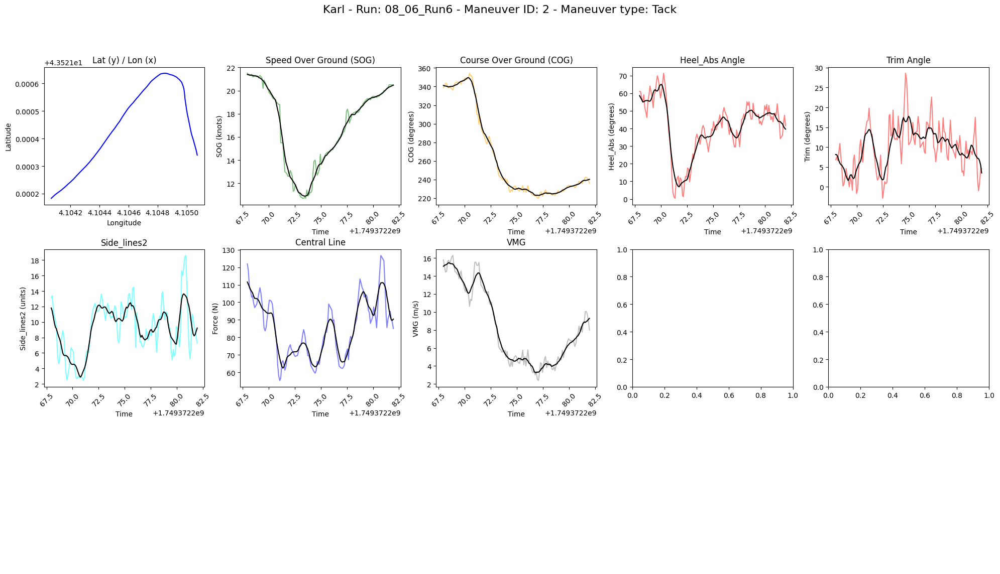


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:44:46.456000+00:00
  Maneuver Type: Tack
  Duration: 14.098999977111816 seconds
  Start Time: 1749372286.456
  End Time: 1749372300.555
  boat_name: Karl Maeder

avg TWS: 7.69 knots
avg TWA: -13.93 degrees
avg TWD: 306.06 degrees


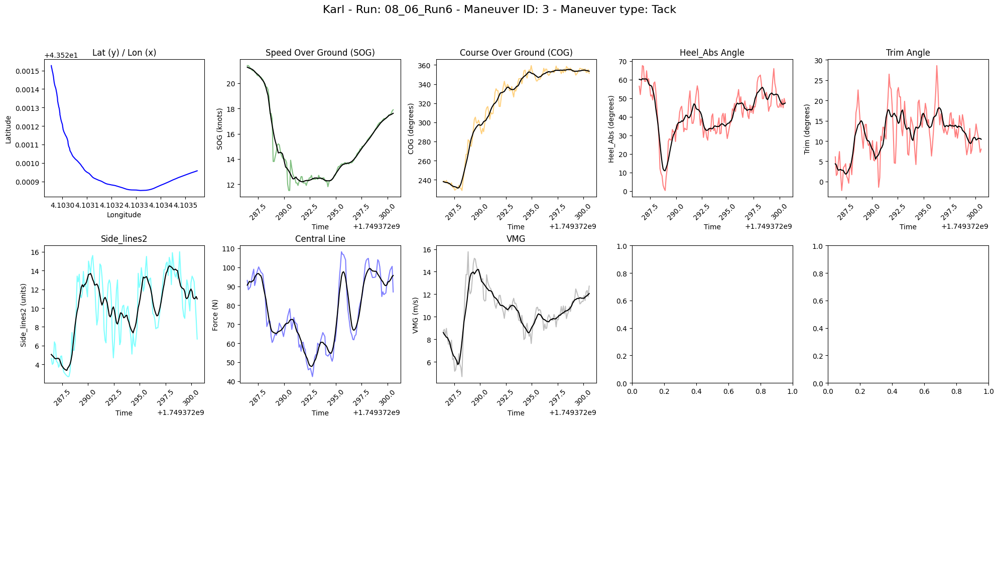


Maneuver details for Maneuver Index: 4
  Maneuver Time: 2025-06-08 08:45:07.064000+00:00
  Maneuver Type: Tack
  Duration: 14.093000173568726 seconds
  Start Time: 1749372307.064
  End Time: 1749372321.157
  boat_name: Karl Maeder

avg TWS: 5.93 knots
avg TWA: 25.75 degrees
avg TWD: 298.86 degrees


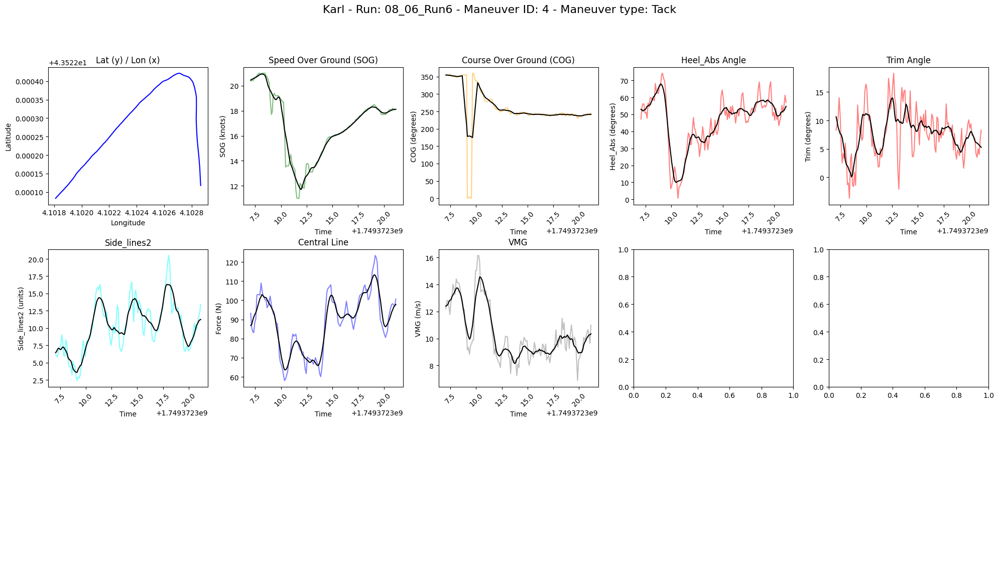


Maneuver details for Maneuver Index: 5
  Maneuver Time: 2025-06-08 08:45:49.657000+00:00
  Maneuver Type: Jibe
  Duration: 14.098999977111816 seconds
  Start Time: 1749372349.657
  End Time: 1749372363.756
  boat_name: Karl Maeder

avg TWS: 8.22 knots
avg TWA: -62.55 degrees
avg TWD: 287.55 degrees


In [ ]:
plot(df, 'Karl')

### Maneuvers of Gian: 

Summary for Gian - Run: 08_06_Run1

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:03:10.157000+00:00
  Maneuver Type: Jibe
  Duration: 14.098999977111816 seconds
  Start Time: 1749369790.157
  End Time: 1749369804.256
  boat_name: SenseBoard

avg TWS: 8.73 knots
avg TWA: -39.68 degrees
avg TWD: 290.97 degrees


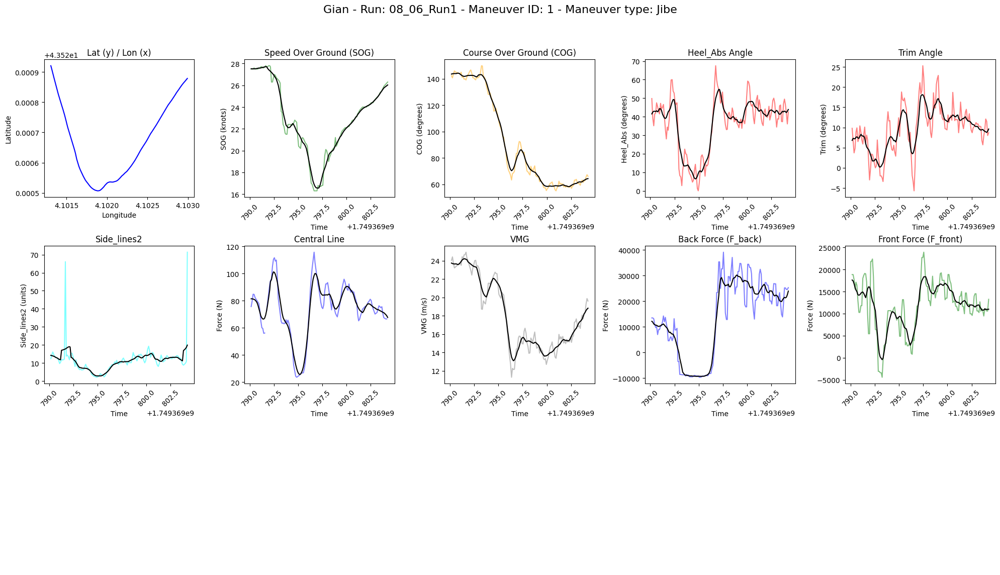


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:03:36.656000+00:00
  Maneuver Type: Jibe
  Duration: 14.005000114440918 seconds
  Start Time: 1749369816.656
  End Time: 1749369830.661
  boat_name: SenseBoard

avg TWS: 8.21 knots
avg TWA: 57.23 degrees
avg TWD: 282.56 degrees


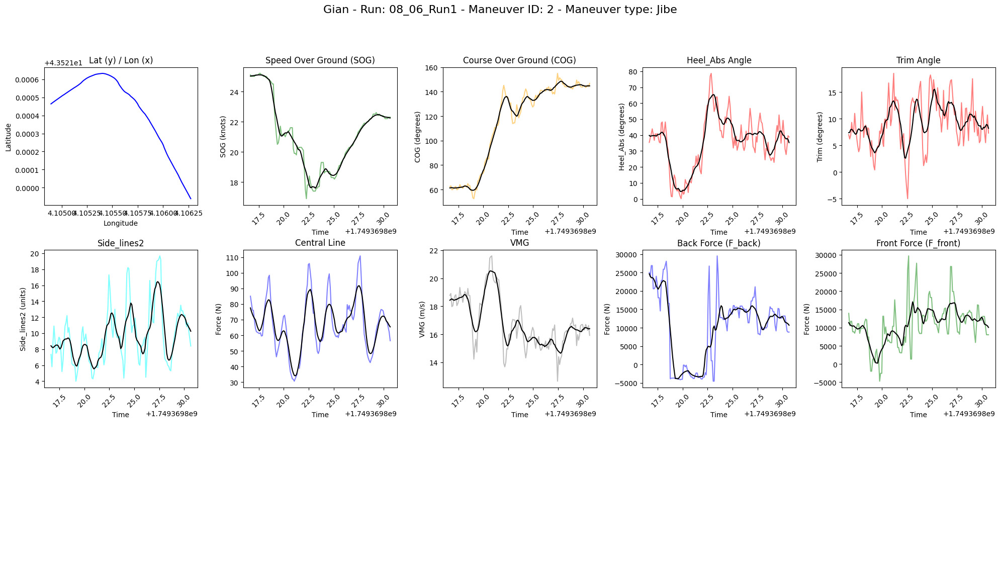


Maneuver details for Maneuver Index: 3
  Maneuver Time: 2025-06-08 08:06:02.358000+00:00
  Maneuver Type: Jibe
  Duration: 14.098000049591064 seconds
  Start Time: 1749369962.358
  End Time: 1749369976.456
  boat_name: SenseBoard

avg TWS: 7.77 knots
avg TWA: 42.29 degrees
avg TWD: 285.79 degrees


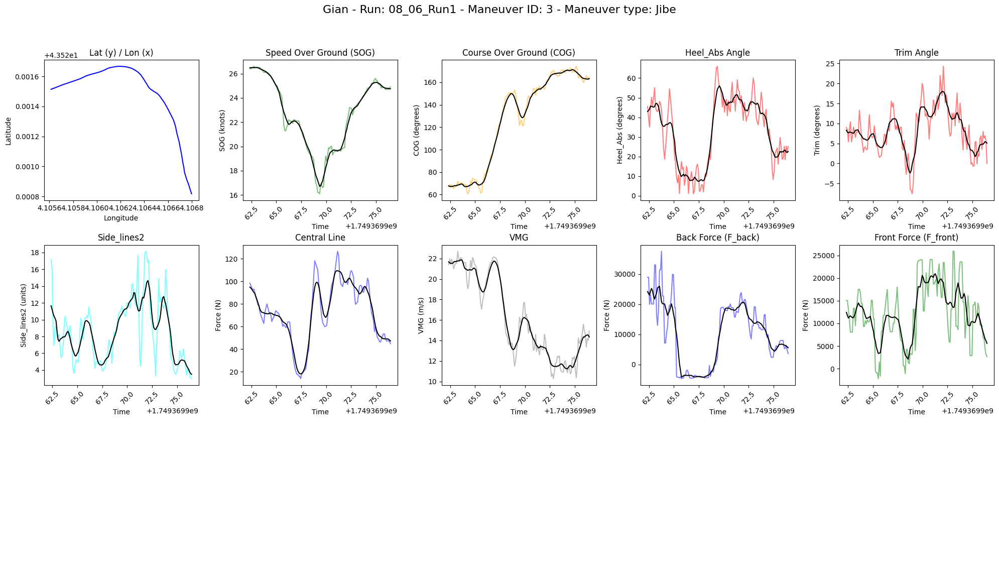

Summary for Gian - Run: 08_06_Run2

Maneuver details for Maneuver Index: 1
  Maneuver Time: 2025-06-08 08:16:12.446000+00:00
  Maneuver Type: Jibe
  Duration: 14.01799988746643 seconds
  Start Time: 1749370572.446
  End Time: 1749370586.464
  boat_name: SenseBoard

avg TWS: 7.53 knots
avg TWA: -41.64 degrees
avg TWD: 284.79 degrees


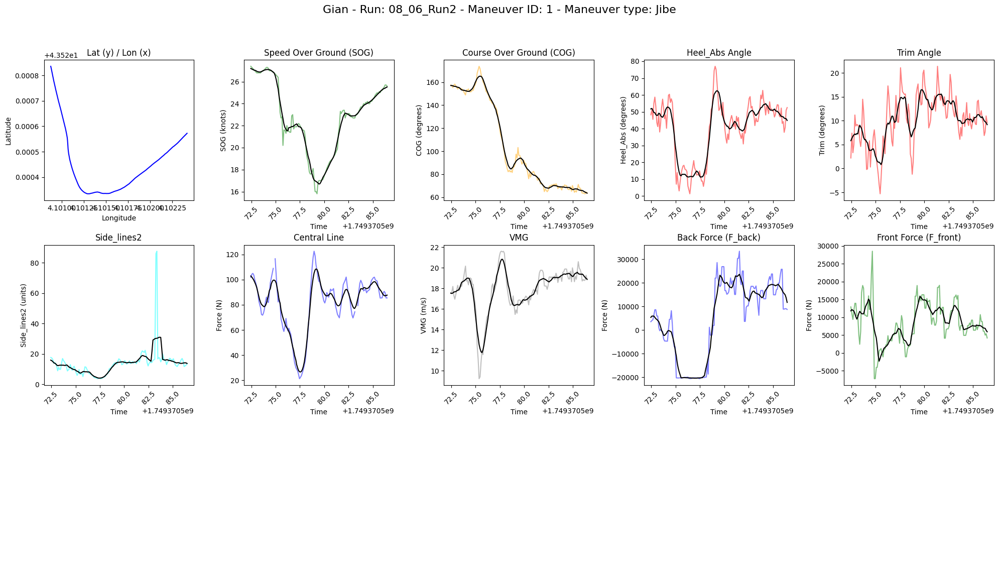


Maneuver details for Maneuver Index: 2
  Maneuver Time: 2025-06-08 08:16:45.858000+00:00
  Maneuver Type: Jibe
  Duration: 14.0 seconds
  Start Time: 1749370605.858
  End Time: 1749370619.858
  boat_name: SenseBoard

avg TWS: 8.78 knots
avg TWA: 23.34 degrees
avg TWD: 288.78 degrees


In [ ]:
plot(df,'Gian')